# Non Sequential  model 

## 1. Reading the data from sql and saving as csv

In [1]:
import pandas as pd
import pymysql

In [11]:
pd.options.display.max_rows = 999
pd.options.display.max_columns = 999

In [12]:
def connect_to_mysql():
    connection = pymysql.connect(host='10.65.47.80',
                            port=4589,Jupyter Notebook p1 Last Checkpoint: 05/30/2018 (unsaved changes) Python 3
Python 3 
File
Edit
View
Insert
Cell
Kernel
Widgets
Help

Non Sequential model
1. Reading the data from sql and saving as csv

import pandas as pd
import pymysql

pd.options.display.max_rows = 999
pd.options.display.max_columns = 999

def connect_to_mysql():
    connection = pymysql.connect(host='10.65.47.80',
                            port=4589,
                            user='netsight',
                            password='Enterasys',
                            db='netsightrpt',
                            charset='utf8',
                            cursorclass=pymysql.cursors.DictCursor)
    return connection
​
conn=connect_to_mysql()

                            user='netsight',
                            password='Enterasys',
                            db='netsightrpt',
                            charset='utf8',
                            cursorclass=pymysql.cursors.DictCursor)
    return connection

conn=connect_to_mysql()

In [104]:
location_count

,counts,location
0,5246871,Salem NH
1,4849863,Other Corporate Labs
2,3526287,RDU
3,1932832,Toronto
4,1494867,SJ South
5,1365385,Chennai
6,466884,Salem GP
7,312731,RDU GP
8,292396,Mexico
9,243620,Shannon


In [105]:
with conn.cursor() as cursor:
        # Read a  record
        sql = "select count(application) as counts,application from appid_datapoint group by application order by counts desc"
        cursor.execute(sql)
        app_count = pd.DataFrame(cursor.fetchall())

In [106]:
app_count

,application,counts
0,Microsoft System Center Operations Manager,21521361
1,DNS,21521361
2,Other,21521361
3,Outlook,21521361
4,Salesforce,21521361
5,Microsoft Office365,21521361
6,Outlook Office365,21521361
7,Microsoft Lync,15706019
8,Skype for Business,8195980
9,NTP,4825569


In [32]:
with conn.cursor() as cursor:
        # Read a  record
        sql = "select max(time_stamp ) from appid_datapoint"
        cursor.execute(sql)
        max_time = pd.DataFrame(cursor.fetchall())

In [33]:
max_time

,max(time_stamp )
0,1518199200000


In [34]:
max_time.iloc[0,0]= max_time.iloc[0,0].astype(int)
tem=pd.to_datetime(pd.Series(max_time.iloc[0,0]),unit='ms')
max_time['date'] = tem

In [35]:
import datetime

In [36]:
import time 
import numpy as np

In [37]:
new_max = (max_time.iloc[0,1]) - datetime.timedelta(days=14)
new_max

Timestamp('2018-01-26 18:00:00')

In [38]:
new_max = pd.DataFrame({'date':new_max},index=[0])
new_max

,date
0,2018-01-26 18:00:00


In [44]:
new_max1 = (new_max.date.values.astype(np.int64)/1000000000)

In [45]:
new_max1[0]

1516989600.0

In [47]:
datetime.datetime.fromtimestamp(new_max1[0])

datetime.datetime(2018, 1, 26, 13, 0)

In [48]:
print(max_time)

   max(time_stamp )                date
0     1518199200000 2018-02-09 18:00:00


In [49]:
print(new_max)

                 date
0 2018-01-26 18:00:00


In [71]:
with conn.cursor() as cursor:
        # Read a  record
        sql = "select count(*) from appid_attribute where time_stamp>="+str(new_max1)
        cursor.execute(sql)
        appid_attribute_count = pd.DataFrame(cursor.fetchall())

In [72]:
appid_attribute_count

,count(*)
0,21494586


In [52]:
l_list = ( 'Selam NH','RDU','Toronto','SJ South' )

In [121]:
with conn.cursor() as cursor:
        # Read a  record
        sql = " select * from appid_attribute where time_stamp>="+str(new_max1)+" and location in ('Selam NH', 'RDU' , 'Toronto', 'SJ South' ) "
        cursor.execute(sql) 
        appid_attribute = pd.DataFrame(cursor.fetchall())

In [30]:
appid_attribute.shape

(6953986, 12)

source, target_address ,target_type ,location,profile,username,time_stamp,application,applicationgroup,byte_count,tx_byte_count,rx_byte_count,flow_count,tx_flow_count,rx_flow_count,tcp_rsp_time,app_rsp_time

In [131]:

appid_attribute.head()

,attribute_id,detailed_location,device_type,location,profile,source,target_address,target_type,time_stamp,user_data1,user_data2,username
0,214744687,None,None,RDU,None,134.141.5.104,10.6.24.124/,CLIENT,1510358400000,None,None,None
1,214744697,None,None,RDU,None,134.141.5.104,10.6.24.92/,SERVER,1510358400000,None,None,None
2,214744698,None,None,RDU,None,134.141.5.104,10.6.31.11/,CLIENT,1510358400000,None,None,None
3,214744699,None,None,RDU,None,134.141.5.104,10.6.31.10/,CLIENT,1510358400000,None,None,None
4,214744700,None,None,RDU,None,134.141.5.104,10.6.16.32/,SERVER,1510358400000,None,None,None


In [62]:
a = pd.DataFrame(appid_attribute.target_address.value_counts())


In [78]:
t_list = (a.iloc[0:20,0])
t_list[0]

10817

In [ ]:
conn.close()
conn = connect_to_mysql()
with conn.cursor() as cursor:
        # Read a  record
        sql = " select count(target_address) as counts from appid_datapoint where  application in ('Outlook', 'Microsoft Office365' , 'Skype for Business'  , 'Salesforce' ) and app_rsp_time>0 group by target_address order by counts desc"
        cursor.execute(sql) 
        appid_datapoint_count = pd.DataFrame(cursor.fetchall())

KeyboardInterrupt: 

In [ ]:
appid_datapoint_count

( '10.6.17.83/', '10.6.31.25/', '10.6.16.182/', '10.6.16.183/', '10.6.16.181/', '10.6.17.64/', '10.6.16.102/', '10.6.17.63/' , '10.6.16.34/', '10.6.16.103/' )

In [ ]:
,

('Outlook', 'Microsoft Office365' , 'Skype for Business' , 'Salesforce' )

In [64]:
conn.close()
conn = connect_to_mysql()
with conn.cursor() as cursor:
        # Read a  record
        sql = " select count(*) from appid_datapoint where  application in ('Outlook', 'Microsoft Office365' , 'Skype for Business'  , 'Salesforce' ) and app_rsp_time>0 and target_address in ( '10.6.17.83/', '10.6.31.25/', '10.6.16.182/', '10.6.16.183/', '10.6.16.181/', '10.6.17.64/', '10.6.16.102/', '10.6.17.63/' , '10.6.16.34/', '10.6.16.103/' ) "
        cursor.execute(sql) 
        appid_datapoint_count = pd.DataFrame(cursor.fetchall())

In [65]:
appid_datapoint_count

,count(*)
0,32618


#### Writing as csvs

In [4]:
appid_attribute = pd.read_csv("appid_attribute_10_days.csv")

In [134]:
appid_attribute.to_csv("appid_attribute_10_days.csv",index=False)

In [ ]:
appid_datapoint.to_csv("appid_datapoint_10_days.csv",index=False)

#### Merged tables

In [ ]:
merged_df = pd.merge(appid_attribute,appid_datapoint,on='attribute_id')

###  Look at on one target 

In [31]:
conn.close()
conn = connect_to_mysql()
with conn.cursor() as cursor:
        # Read a  record
        sql = " select count(*) from appid_datapoint where  application in ('Outlook', 'Microsoft Office365' , 'Skype for Business'  , 'Salesforce' ) and app_rsp_time>0 and target_address in ( '10.6.17.83/' ) "
        cursor.execute(sql) 
        appid_datapoint_count_1 = pd.DataFrame(cursor.fetchall())

In [32]:
appid_datapoint_count_1

,count(*)
0,5


In [45]:
conn.close()
conn = connect_to_mysql()
with conn.cursor() as cursor:
        # Read a  record
        sql = "select * from appid_datapoint where  application in ('Outlook', 'Microsoft Office365' , 'Skype for Business'  , 'Salesforce' ) and app_rsp_time>0 and target_address in ( '10.6.17.83/' ) "
        cursor.execute(sql) 
        appid_datapoint1 = pd.DataFrame(cursor.fetchall())

In [34]:
appid_datapoint1

,app_rsp_time,application,applicationgroup,byte_count,flow_count,rx_byte_count,rx_flow_count,source,target_address,target_attribute_id,tcp_rsp_time,time_stamp,tx_byte_count,tx_flow_count,user_data,zone
0,31861,Microsoft Office365,Cloud Computing,13596,9,10441,3,10.6.1.101,10.6.17.83/,227331000,27034,1515006000000,3155,6,None,None
1,32260,Microsoft Office365,Cloud Computing,13756,7,10441,3,10.6.1.101,10.6.17.83/,227359532,27318,1515013200000,3315,4,None,None
2,34338,Microsoft Office365,Cloud Computing,27648,14,20882,6,10.6.1.101,10.6.17.83/,227544042,27489,1515078000000,6766,8,None,None
3,32417,Microsoft Office365,Cloud Computing,27852,20,21034,8,10.6.1.101,10.6.17.83/,227610343,27295,1515096000000,6818,12,None,None
4,916676,Microsoft Office365,Cloud Computing,16809,7,12353,3,10.6.1.101,10.6.17.83/,227637802,33991,1515106800000,4456,4,None,None


In [13]:
conn.close()
conn = connect_to_mysql()
with conn.cursor() as cursor:
        # Read a  record
        sql = "select * from appid_datapoint where  app_rsp_time>0 and target_address in ( '10.6.17.83/' ) "
        cursor.execute(sql) 
        appid_datapoint1 = pd.DataFrame(cursor.fetchall())

In [14]:
appid_datapoint1

,app_rsp_time,application,applicationgroup,byte_count,flow_count,rx_byte_count,rx_flow_count,source,target_address,target_attribute_id,tcp_rsp_time,time_stamp,tx_byte_count,tx_flow_count,user_data,zone
0,278951,Microsoft System Center Configuration Manager,VPN and Security,1135578,242,720748,140,134.141.208.230,10.6.17.83/,214751447,237309,1510358400000,414830,102,None,None
1,242976,Extreme Networks,Corporate Website,330396,938,186408,445,134.141.208.230,10.6.17.83/,214751447,237043,1510358400000,143988,493,None,None
2,57625,DCERPC,Protocols,203233098,513,7040896,229,134.141.115.101,10.6.17.83/,214752728,41041,1510358400000,196192202,284,None,None
3,74890,Extreme Networks,Corporate Website,1565114,932,209016,444,134.141.115.101,10.6.17.83/,214752728,72184,1510358400000,1356098,488,None,None
4,114541,Microsoft System Center Configuration Manager,VPN and Security,3010918,812,2001092,460,134.141.115.101,10.6.17.83/,214752728,72131,1510358400000,1009826,352,None,None
5,75680,Windows Update,Software Updates,6715906,618,6049808,312,134.141.115.101,10.6.17.83/,214752728,72315,1510358400000,666098,306,None,None
6,3739,CIFS,Storage,826972,140,305684,50,134.141.115.101,10.6.17.83/,214752728,2784,1510358400000,521288,90,None,None
7,45365,Extreme Networks,Corporate Website,3071408,8450,1666944,3687,134.141.5.104,10.6.17.83/,214744817,41795,1510358400000,1404464,4763,None,None
8,80899,Microsoft System Center Configuration Manager,VPN and Security,12528604,2601,7546998,1359,134.141.5.104,10.6.17.83/,214744817,41450,1510358400000,4981606,1242,None,None
9,49678,Windows Update,Software Updates,26563226,654,25068209,337,134.141.5.104,10.6.17.83/,214744817,41615,1510358400000,1495017,317,None,None


In [16]:
appid_datapoint1

,app_rsp_time,application,applicationgroup,byte_count,flow_count,rx_byte_count,rx_flow_count,source,target_address,target_attribute_id,tcp_rsp_time,time_stamp,tx_byte_count,tx_flow_count,user_data,zone
0,278951,Microsoft System Center Configuration Manager,VPN and Security,1135578,242,720748,140,134.141.208.230,10.6.17.83/,214751447,237309,1510358400000,414830,102,None,None
1,242976,Extreme Networks,Corporate Website,330396,938,186408,445,134.141.208.230,10.6.17.83/,214751447,237043,1510358400000,143988,493,None,None
2,57625,DCERPC,Protocols,203233098,513,7040896,229,134.141.115.101,10.6.17.83/,214752728,41041,1510358400000,196192202,284,None,None
3,74890,Extreme Networks,Corporate Website,1565114,932,209016,444,134.141.115.101,10.6.17.83/,214752728,72184,1510358400000,1356098,488,None,None
4,114541,Microsoft System Center Configuration Manager,VPN and Security,3010918,812,2001092,460,134.141.115.101,10.6.17.83/,214752728,72131,1510358400000,1009826,352,None,None
5,75680,Windows Update,Software Updates,6715906,618,6049808,312,134.141.115.101,10.6.17.83/,214752728,72315,1510358400000,666098,306,None,None
6,3739,CIFS,Storage,826972,140,305684,50,134.141.115.101,10.6.17.83/,214752728,2784,1510358400000,521288,90,None,None
7,45365,Extreme Networks,Corporate Website,3071408,8450,1666944,3687,134.141.5.104,10.6.17.83/,214744817,41795,1510358400000,1404464,4763,None,None
8,80899,Microsoft System Center Configuration Manager,VPN and Security,12528604,2601,7546998,1359,134.141.5.104,10.6.17.83/,214744817,41450,1510358400000,4981606,1242,None,None
9,49678,Windows Update,Software Updates,26563226,654,25068209,337,134.141.5.104,10.6.17.83/,214744817,41615,1510358400000,1495017,317,None,None


In [54]:
c = appid_attribute.columns
c

Index(['attribute_id', 'detailed_location', 'device_type', 'location',
       'profile', 'source', 'target_address', 'target_type', 'time_stamp',
       'user_data1', 'user_data2', 'username'],
      dtype='object')

In [18]:
c = ['target_attribute_id', 'detailed_location', 'device_type', 'location',
       'profile', 'source', 'target_address', 'target_type', 'time_stamp',
       'user_data1', 'user_data2', 'username']
appid_attribute.columns = c
appid_attribute['attribute_id'] = appid_attribute['target_attribute_id']

In [19]:
appid_datapoint1.shape

(44264, 16)

In [20]:
df3 = pd.merge(appid_datapoint1,appid_attribute,on='target_attribute_id',how='left')
df3.shape

(44264, 28)

In [104]:
df3[['target_address_x','target_address_x','source_x','source_y']]

,target_address_x,target_address_x,source_x,source_y
0,10.6.17.83/,10.6.17.83/,134.141.208.230,134.141.208.230
1,10.6.17.83/,10.6.17.83/,134.141.208.230,134.141.208.230
2,10.6.17.83/,10.6.17.83/,134.141.115.101,134.141.115.101
3,10.6.17.83/,10.6.17.83/,134.141.115.101,134.141.115.101
4,10.6.17.83/,10.6.17.83/,134.141.115.101,134.141.115.101
5,10.6.17.83/,10.6.17.83/,134.141.115.101,134.141.115.101
6,10.6.17.83/,10.6.17.83/,134.141.115.101,134.141.115.101
7,10.6.17.83/,10.6.17.83/,134.141.5.104,134.141.5.104
8,10.6.17.83/,10.6.17.83/,134.141.5.104,134.141.5.104
9,10.6.17.83/,10.6.17.83/,134.141.5.104,134.141.5.104


In [105]:
df3[['attribute_id','target_address_x','source_x']]

,attribute_id,target_address_x,source_x
0,214751447.0,10.6.17.83/,134.141.208.230
1,214751447.0,10.6.17.83/,134.141.208.230
2,214752728.0,10.6.17.83/,134.141.115.101
3,214752728.0,10.6.17.83/,134.141.115.101
4,214752728.0,10.6.17.83/,134.141.115.101
5,214752728.0,10.6.17.83/,134.141.115.101
6,214752728.0,10.6.17.83/,134.141.115.101
7,214744817.0,10.6.17.83/,134.141.5.104
8,214744817.0,10.6.17.83/,134.141.5.104
9,214744817.0,10.6.17.83/,134.141.5.104


In [55]:
appid_attribute['attribute_id'] = appid_attribute['attribute_id'].astype(str)

In [107]:
df3[df3.attribute_id==214751447.0].source_x.value_counts()

134.141.208.230    2
Name: source_x, dtype: int64

In [108]:
df3[df3.attribute_id==214751447.0].location.value_counts()

RDU    2
Name: location, dtype: int64

In [83]:
appid_datapoint1.source.nunique()

6

In [87]:
appid_datapoint1.target_attribute_id.nunique()

9954

In [84]:
appid_datapoint1.application.nunique()

28

In [85]:
appid_datapoint1.application.value_counts()

Microsoft System Center Configuration Manager    9951
Extreme Networks                                 8819
Windows Update                                   7768
DCERPC                                           5825
CIFS                                             5176
NTLMSSP                                          2091
sms                                              1658
Encrypted Web                                    1114
Web                                               566
MSRDP                                             354
usnc-sccmsql-p1                                   350
Microsoft System Center Operations Manager        289
WebDAV                                            124
Microsoft Corp                                     93
Microsoft Office Download                          19
10.6.17.83                                         16
NetBIOS                                            11
SSH                                                10
usnc-sccmsql-p1.corp.extreme

In [125]:
appid_datapoint1.time_stamp.loc[appid_datapoint1.application=="Microsoft System Center Configuration Manager"].nunique()

2173

In [126]:
appid_datapoint1.time_stamp.loc[appid_datapoint1.application=="Microsoft Office365"].nunique()

5

In [82]:
shape

(44264, 16)

In [ ]:
Z

In [56]:
import matplotlib.pyplot as plt


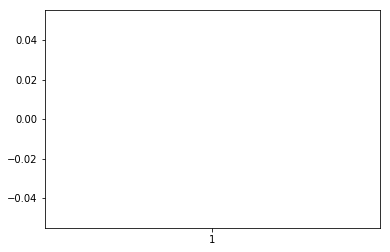

In [58]:
plt.boxplot(appid_datapoint1[appid_datapoint1.application=='Skype for Business'].app_rsp_time)
plt.show()

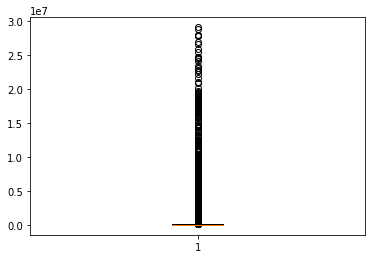

In [60]:
plt.boxplot(appid_datapoint1.app_rsp_time)
plt.show()

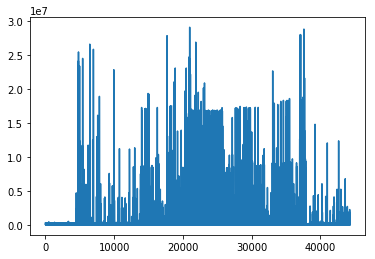

In [61]:
plt.plot(appid_datapoint1.app_rsp_time)
plt.show()

In [35]:
appid_datapoint1

,app_rsp_time,application,applicationgroup,byte_count,flow_count,rx_byte_count,rx_flow_count,source,target_address,target_attribute_id,tcp_rsp_time,time_stamp,tx_byte_count,tx_flow_count,user_data,zone
0,278951,Microsoft System Center Configuration Manager,VPN and Security,1135578,242,720748,140,134.141.208.230,10.6.17.83/,214751447,237309,1510358400000,414830,102,None,None
1,242976,Extreme Networks,Corporate Website,330396,938,186408,445,134.141.208.230,10.6.17.83/,214751447,237043,1510358400000,143988,493,None,None
2,57625,DCERPC,Protocols,203233098,513,7040896,229,134.141.115.101,10.6.17.83/,214752728,41041,1510358400000,196192202,284,None,None
3,74890,Extreme Networks,Corporate Website,1565114,932,209016,444,134.141.115.101,10.6.17.83/,214752728,72184,1510358400000,1356098,488,None,None
4,114541,Microsoft System Center Configuration Manager,VPN and Security,3010918,812,2001092,460,134.141.115.101,10.6.17.83/,214752728,72131,1510358400000,1009826,352,None,None
5,75680,Windows Update,Software Updates,6715906,618,6049808,312,134.141.115.101,10.6.17.83/,214752728,72315,1510358400000,666098,306,None,None
6,3739,CIFS,Storage,826972,140,305684,50,134.141.115.101,10.6.17.83/,214752728,2784,1510358400000,521288,90,None,None
7,45365,Extreme Networks,Corporate Website,3071408,8450,1666944,3687,134.141.5.104,10.6.17.83/,214744817,41795,1510358400000,1404464,4763,None,None
8,80899,Microsoft System Center Configuration Manager,VPN and Security,12528604,2601,7546998,1359,134.141.5.104,10.6.17.83/,214744817,41450,1510358400000,4981606,1242,None,None
9,49678,Windows Update,Software Updates,26563226,654,25068209,337,134.141.5.104,10.6.17.83/,214744817,41615,1510358400000,1495017,317,None,None


In [59]:
df3

,app_rsp_time,application,applicationgroup,byte_count,flow_count,rx_byte_count,rx_flow_count,source_x,target_address_x,target_attribute_id,tcp_rsp_time,time_stamp_x,tx_byte_count,tx_flow_count,user_data,zone,detailed_location,device_type,location,profile,source_y,target_address_y,target_type,time_stamp_y,user_data1,user_data2,username,attribute_id
0,278951,Microsoft System Center Configuration Manager,VPN and Security,1135578,242,720748,140,134.141.208.230,10.6.17.83/,214751447,237309,1510358400000,414830,102,None,None,NaN,NaN,RDU,NaN,134.141.208.230,10.6.17.83/,SERVER,1.510358e+12,NaN,NaN,NaN,214751447.0
1,242976,Extreme Networks,Corporate Website,330396,938,186408,445,134.141.208.230,10.6.17.83/,214751447,237043,1510358400000,143988,493,None,None,NaN,NaN,RDU,NaN,134.141.208.230,10.6.17.83/,SERVER,1.510358e+12,NaN,NaN,NaN,214751447.0
2,57625,DCERPC,Protocols,203233098,513,7040896,229,134.141.115.101,10.6.17.83/,214752728,41041,1510358400000,196192202,284,None,None,NaN,NaN,RDU,NaN,134.141.115.101,10.6.17.83/,SERVER,1.510358e+12,NaN,NaN,NaN,214752728.0
3,74890,Extreme Networks,Corporate Website,1565114,932,209016,444,134.141.115.101,10.6.17.83/,214752728,72184,1510358400000,1356098,488,None,None,NaN,NaN,RDU,NaN,134.141.115.101,10.6.17.83/,SERVER,1.510358e+12,NaN,NaN,NaN,214752728.0
4,114541,Microsoft System Center Configuration Manager,VPN and Security,3010918,812,2001092,460,134.141.115.101,10.6.17.83/,214752728,72131,1510358400000,1009826,352,None,None,NaN,NaN,RDU,NaN,134.141.115.101,10.6.17.83/,SERVER,1.510358e+12,NaN,NaN,NaN,214752728.0
5,75680,Windows Update,Software Updates,6715906,618,6049808,312,134.141.115.101,10.6.17.83/,214752728,72315,1510358400000,666098,306,None,None,NaN,NaN,RDU,NaN,134.141.115.101,10.6.17.83/,SERVER,1.510358e+12,NaN,NaN,NaN,214752728.0
6,3739,CIFS,Storage,826972,140,305684,50,134.141.115.101,10.6.17.83/,214752728,2784,1510358400000,521288,90,None,None,NaN,NaN,RDU,NaN,134.141.115.101,10.6.17.83/,SERVER,1.510358e+12,NaN,NaN,NaN,214752728.0
7,45365,Extreme Networks,Corporate Website,3071408,8450,1666944,3687,134.141.5.104,10.6.17.83/,214744817,41795,1510358400000,1404464,4763,None,None,NaN,NaN,RDU,NaN,134.141.5.104,10.6.17.83/,SERVER,1.510358e+12,NaN,NaN,NaN,214744817.0
8,80899,Microsoft System Center Configuration Manager,VPN and Security,12528604,2601,7546998,1359,134.141.5.104,10.6.17.83/,214744817,41450,1510358400000,4981606,1242,None,None,NaN,NaN,RDU,NaN,134.141.5.104,10.6.17.83/,SERVER,1.510358e+12,NaN,NaN,NaN,214744817.0
9,49678,Windows Update,Software Updates,26563226,654,25068209,337,134.141.5.104,10.6.17.83/,214744817,41615,1510358400000,1495017,317,None,None,NaN,NaN,RDU,NaN,134.141.5.104,10.6.17.83/,SERVER,1.510358e+12,NaN,NaN,NaN,214744817.0


In [62]:
df3.target_type.value_counts()

SERVER    40508
CLIENT     3684
Name: target_type, dtype: int64

In [63]:
df3.application.value_counts()

Microsoft System Center Configuration Manager    9951
Extreme Networks                                 8819
Windows Update                                   7768
DCERPC                                           5825
CIFS                                             5176
NTLMSSP                                          2091
sms                                              1658
Encrypted Web                                    1114
Web                                               566
MSRDP                                             354
usnc-sccmsql-p1                                   350
Microsoft System Center Operations Manager        289
WebDAV                                            124
Microsoft Corp                                     93
Microsoft Office Download                          19
10.6.17.83                                         16
NetBIOS                                            11
SSH                                                10
usnc-sccmsql-p1.corp.extreme

In [36]:
conn.close()
conn = connect_to_mysql()
with conn.cursor() as cursor:
        # Read a  record
        
        sql = " select * from appid_attribute where  attribute_id in ( 214751447 , 214752728, 214744817, 214749473, 214753868 )" 
        cursor.execute(sql)
        appid_attribute1 = pd.DataFrame(cursor.fetchall())

In [37]:
appid_attribute1

,attribute_id,detailed_location,device_type,location,profile,source,target_address,target_type,time_stamp,user_data1,user_data2,username
0,214744817,None,None,RDU,None,134.141.5.104,10.6.17.83/,SERVER,1510358400000,None,None,None
1,214749473,None,None,RDU,None,10.6.1.101,10.6.17.83/,SERVER,1510358400000,None,None,None
2,214751447,None,None,RDU,None,134.141.208.230,10.6.17.83/,SERVER,1510358400000,None,None,None
3,214752728,None,None,RDU,None,134.141.115.101,10.6.17.83/,SERVER,1510358400000,None,None,None
4,214753868,None,None,RDU,None,134.141.5.104,10.6.17.83/,SERVER,1510362000000,None,None,None


In [38]:
appid_attribute1.columns 

Index(['attribute_id', 'detailed_location', 'device_type', 'location',
       'profile', 'source', 'target_address', 'target_type', 'time_stamp',
       'user_data1', 'user_data2', 'username'],
      dtype='object')

In [39]:
c = ['target_attribute_id', 'detailed_location', 'device_type', 'location',
       'profile', 'source', 'target_address', 'target_type', 'time_stamp',
       'user_data1', 'user_data2', 'username']
appid_attribute1.columns =c

In [40]:
appid_attribute1['attribute_id']  = appid_attribute1['target_attribute_id'] 

In [41]:
attribute_id_full = pd.merge(appid_attribute1,appid_datapoint1 ,on='target_attribute_id',how='left')
attribute_id_full.shape

(30, 28)

In [42]:
attribute_id_full

,target_attribute_id,detailed_location,device_type,location,profile,source_x,target_address_x,target_type,time_stamp_x,user_data1,user_data2,username,attribute_id,app_rsp_time,application,applicationgroup,byte_count,flow_count,rx_byte_count,rx_flow_count,source_y,target_address_y,tcp_rsp_time,time_stamp_y,tx_byte_count,tx_flow_count,user_data,zone
0,214744817,None,None,RDU,None,134.141.5.104,10.6.17.83/,SERVER,1510358400000,None,None,None,214744817,45365,Extreme Networks,Corporate Website,3071408,8450,1666944,3687,134.141.5.104,10.6.17.83/,41795,1510358400000,1404464,4763,None,None
1,214744817,None,None,RDU,None,134.141.5.104,10.6.17.83/,SERVER,1510358400000,None,None,None,214744817,80899,Microsoft System Center Configuration Manager,VPN and Security,12528604,2601,7546998,1359,134.141.5.104,10.6.17.83/,41450,1510358400000,4981606,1242,None,None
2,214744817,None,None,RDU,None,134.141.5.104,10.6.17.83/,SERVER,1510358400000,None,None,None,214744817,49678,Windows Update,Software Updates,26563226,654,25068209,337,134.141.5.104,10.6.17.83/,41615,1510358400000,1495017,317,None,None
3,214744817,None,None,RDU,None,134.141.5.104,10.6.17.83/,SERVER,1510358400000,None,None,None,214744817,44876,sms,Web Applications,321699,593,206763,318,134.141.5.104,10.6.17.83/,41682,1510358400000,114936,275,None,None
4,214744817,None,None,RDU,None,134.141.5.104,10.6.17.83/,SERVER,1510358400000,None,None,None,214744817,5314,CIFS,Storage,11372142,24,11079804,12,134.141.5.104,10.6.17.83/,731,1510358400000,292338,12,None,None
5,214744817,None,None,RDU,None,134.141.5.104,10.6.17.83/,SERVER,1510358400000,None,None,None,214744817,1204,Microsoft System Center Operations Manager,VPN and Security,940916,343,76762,169,134.141.5.104,10.6.17.83/,1131,1510358400000,864154,174,None,None
6,214744817,None,None,RDU,None,134.141.5.104,10.6.17.83/,SERVER,1510358400000,None,None,None,214744817,182342,DCERPC,Protocols,336814,174,63872,88,134.141.5.104,10.6.17.83/,2802,1510358400000,272942,86,None,None
7,214744817,None,None,RDU,None,134.141.5.104,10.6.17.83/,SERVER,1510358400000,None,None,None,214744817,149184,NTLMSSP,Protocols,120060,16,69556,6,134.141.5.104,10.6.17.83/,14553,1510358400000,50504,10,None,None
8,214749473,None,None,RDU,None,10.6.1.101,10.6.17.83/,SERVER,1510358400000,None,None,None,214749473,120161,DCERPC,Protocols,100157981,1237,4600846,524,10.6.1.101,10.6.17.83/,80666,1510358400000,95557135,713,None,None
9,214749473,None,None,RDU,None,10.6.1.101,10.6.17.83/,SERVER,1510358400000,None,None,None,214749473,40178,Microsoft System Center Configuration Manager,VPN and Security,20800368,4181,12879561,2371,10.6.1.101,10.6.17.83/,113,1510358400000,7920807,1810,None,None


In [43]:
attribute_id_full.location.value_counts()

RDU    30
Name: location, dtype: int64

In [47]:
attribute_id_full[attribute_id_full.target_attribute_id==214749473].source_x.value_counts()

10.6.1.101    7
Name: source_x, dtype: int64

In [48]:
attribute_id_full.application.value_counts()

Microsoft System Center Configuration Manager    5
Extreme Networks                                 5
Windows Update                                   4
DCERPC                                           4
CIFS                                             4
Microsoft System Center Operations Manager       3
sms                                              3
NTLMSSP                                          2
Name: application, dtype: int64

In [51]:
attribute_id_full.time_stamp_y.value_counts()

1510358400000    22
1510362000000     8
Name: time_stamp_y, dtype: int64

In [5]:
max_time.iloc[0,0]= max_time.iloc[0,0].astype(int)
tem=pd.to_datetime(pd.Series(max_time.iloc[0,0]),unit='ms')
max_time['date'] = tem

In [58]:
new_dates = attribute_id_full.time_stamp_y.astype(int)
tem=pd.to_datetime(pd.Series(new_dates),unit='ms')
#max_time['date'] = tem
tem
#new_dates

0    2017-11-11 00:00:00
1    2017-11-11 00:00:00
2    2017-11-11 00:00:00
3    2017-11-11 00:00:00
4    2017-11-11 00:00:00
5    2017-11-11 00:00:00
6    2017-11-11 00:00:00
7    2017-11-11 00:00:00
8    2017-11-11 00:00:00
9    2017-11-11 00:00:00
10   2017-11-11 00:00:00
11   2017-11-11 00:00:00
12   2017-11-11 00:00:00
13   2017-11-11 00:00:00
14   2017-11-11 00:00:00
15   2017-11-11 00:00:00
16   2017-11-11 00:00:00
17   2017-11-11 00:00:00
18   2017-11-11 00:00:00
19   2017-11-11 00:00:00
20   2017-11-11 00:00:00
21   2017-11-11 00:00:00
22   2017-11-11 01:00:00
23   2017-11-11 01:00:00
24   2017-11-11 01:00:00
25   2017-11-11 01:00:00
26   2017-11-11 01:00:00
27   2017-11-11 01:00:00
28   2017-11-11 01:00:00
29   2017-11-11 01:00:00
Name: time_stamp_y, dtype: datetime64[ns]

### 2. 4 app 5 target details

In [14]:
import numpy as np
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode(connected=True)

def plot_test(x,y,title1):
    #label = data.index[0:len(compare_train)]
    label1=x
    #py.init_notebook_mode
        

    # Create a trace
    
    trace1 = go.Scatter(
        x = label1,
        y = np.array(y),
        name ='Actual',
        mode = 'lines'
    
        )


    # Edit the layout
    layout = dict(title = title1,
              xaxis = dict(title = 'Date'),
              yaxis = dict(title = 'value'),
              )
    

    data = [trace1]
    fig = dict(data=data, layout=layout)
    fig =go.Figure(data=data, layout=layout)
    py.iplot(fig, filename='basic-line')
    #py.iplot(fig, filename='jupyter/basic_bar')
    
    

In [15]:
import numpy as np
from bokeh.plotting import figure,show
from bokeh.io import  output_notebook

def plot_test1(x,y,title):
    #label = data.index[0:len(compare_train)]
    label1=x
    #py.init_notebook_mode
        

    # Create a trace
    
    
    output_notebook()
    p=figure(title=title,plot_height = 900 ,plot_width =600)
    p.line(label1,np.array(y))
    show(p)
    
    

In [7]:
conn.close()
conn = connect_to_mysql()
with conn.cursor() as cursor:
        # Read a  record
        sql = " select * from appid_datapoint where  application in ('Outlook', 'Microsoft Office365' , 'Skype for Business'  , 'Salesforce' ) and app_rsp_time>0 and target_address in ( '10.6.17.83/', '10.6.31.25/', '10.6.16.182/', '10.6.16.183/', '10.6.16.181/', '10.6.17.64/', '10.6.16.102/', '10.6.17.63/' , '10.6.16.34/', '10.6.16.103/' ) "
        cursor.execute(sql) 
        appid_datapoint4 = pd.DataFrame(cursor.fetchall())
appid_datapoint4.shape

(32618, 16)

In [8]:
import matplotlib.pyplot as plt

In [9]:
appid_datapoint4_full = pd.merge(appid_datapoint4, appid_attribute , on ='target_attribute_id',how='left')

KeyError: 'target_attribute_id'

In [ ]:
appid_datapoint_outlook = appid_datapoint4_full[appid_datapoint4_full.application=='Microsoft Office365']

In [ ]:
plt.plot(appid_datapoint_outlook.app_rsp_time)
plt.show()

In [ ]:
x=list(range(len(appid_datapoint_outlook)))
plot_test(x,appid_datapoint_outlook.app_rsp_time,'outlook')

In [ ]:
plot_test1(x,appid_datapoint_outlook.app_rsp_time)

In [104]:
appid_datapoint_outlook

,app_rsp_time,application,applicationgroup,byte_count,flow_count,rx_byte_count,rx_flow_count,source_x,target_address_x,target_attribute_id,tcp_rsp_time,time_stamp_x,tx_byte_count,tx_flow_count,user_data,zone,detailed_location,device_type,location,profile,source_y,target_address_y,target_type,time_stamp_y,user_data1,user_data2,username,attribute_id
75,32147,Microsoft Office365,Cloud Computing,16888,6,12120,2,10.6.1.101,10.6.16.181/,214946571,27183,1510444800000,4768,4,None,None,NaN,NaN,RDU,NaN,10.6.1.101,10.6.16.181/,SERVER,1.510445e+12,NaN,NaN,NaN,214946571.0
197,32530,Microsoft Office365,Cloud Computing,103544,15,69914,7,10.6.1.101,10.6.16.181/,215269099,27113,1510581600000,33630,8,None,None,NaN,NaN,RDU,NaN,10.6.1.101,10.6.16.181/,SERVER,1.510582e+12,NaN,NaN,NaN,215269099.0
221,32926,Microsoft Office365,Cloud Computing,153794,21,102932,10,10.6.1.101,10.6.16.181/,215345814,28099,1510603200000,50862,11,None,None,NaN,NaN,RDU,NaN,10.6.1.101,10.6.16.181/,CLIENT,1.510603e+12,NaN,NaN,NaN,215345814.0
290,32053,Microsoft Office365,Cloud Computing,58038,8,39685,4,10.6.1.101,10.6.16.181/,215543360,27309,1510671600000,18353,4,None,None,NaN,NaN,RDU,NaN,10.6.1.101,10.6.16.181/,SERVER,1.510672e+12,NaN,NaN,NaN,215543360.0
4132,32017,Microsoft Office365,Cloud Computing,10729,5,10525,3,10.6.1.101,10.6.16.181/,230459315,27139,1516039200000,204,2,None,None,NaN,NaN,RDU,NaN,10.6.1.101,10.6.16.181/,CLIENT,1.516039e+12,NaN,NaN,NaN,230459315.0
4143,32817,Microsoft Office365,Cloud Computing,66302,10,46588,5,10.6.1.101,10.6.16.181/,230484105,27306,1516046400000,19714,5,None,None,NaN,NaN,RDU,NaN,10.6.1.101,10.6.16.181/,SERVER,1.516046e+12,NaN,NaN,NaN,230484105.0
4199,32069,Microsoft Office365,Cloud Computing,10648,3,5228,1,10.6.1.101,10.6.16.181/,230692411,27372,1516107600000,5420,2,None,None,NaN,NaN,RDU,NaN,10.6.1.101,10.6.16.181/,SERVER,1.516108e+12,NaN,NaN,NaN,230692411.0
4211,33259,Microsoft Office365,Cloud Computing,70276,8,55618,4,10.6.1.101,10.6.16.181/,230737903,29934,1516118400000,14658,4,None,None,NaN,NaN,RDU,NaN,10.6.1.101,10.6.16.181/,SERVER,1.516118e+12,NaN,NaN,NaN,230737903.0
5280,31026,Microsoft Office365,Cloud Computing,619668,20,351172,12,10.6.1.101,10.6.16.181/,234772974,26040,1517749200000,268496,8,None,None,NaN,NaN,RDU,NaN,10.6.1.101,10.6.16.181/,SERVER,1.517749e+12,NaN,NaN,NaN,234772974.0
5287,32192,Microsoft Office365,Cloud Computing,490870,7,305621,5,10.6.1.101,10.6.16.181/,234783667,27163,1517752800000,185249,2,None,None,NaN,NaN,RDU,NaN,10.6.1.101,10.6.16.181/,SERVER,1.517753e+12,NaN,NaN,NaN,234783667.0


#### 2.1 outlook across target

/root/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:52: FutureWarning:

reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead



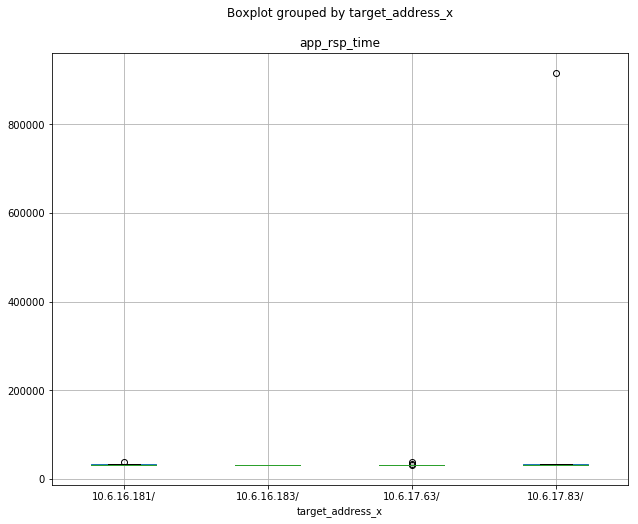

In [100]:
fig, ax = plt.subplots(figsize=(10,8))
plt.suptitle('')
appid_datapoint_outlook.boxplot(column=['app_rsp_time'], by='target_address_x', ax=ax)
plt.show()

In [819]:
a= appid_datapoint_outlook[appid_datapoint_outlook.target_address_x=='10.6.16.181/']

In [820]:
plot_test1(list(range(len(a))),a.app_rsp_time)

Loading BokehJS ...

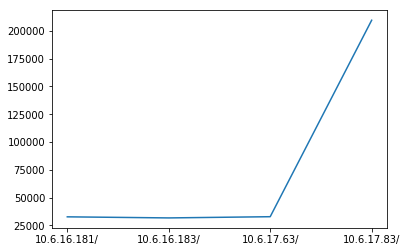

In [101]:
plt.plot(appid_datapoint_outlook.groupby('target_address_x').mean().app_rsp_time)
plt.show()

#### 2.2 outlook across source

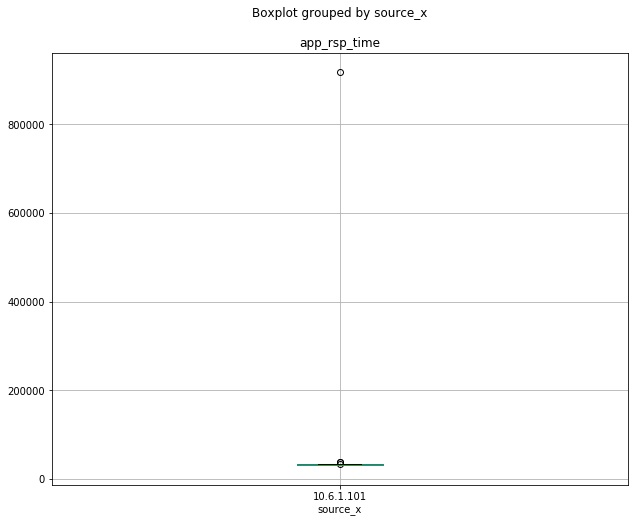

In [102]:
fig, ax = plt.subplots(figsize=(10,8))
plt.suptitle('')
appid_datapoint_outlook.boxplot(column=['app_rsp_time'], by='source_x', ax=ax)
plt.show()

#### 2.3 outlook across location

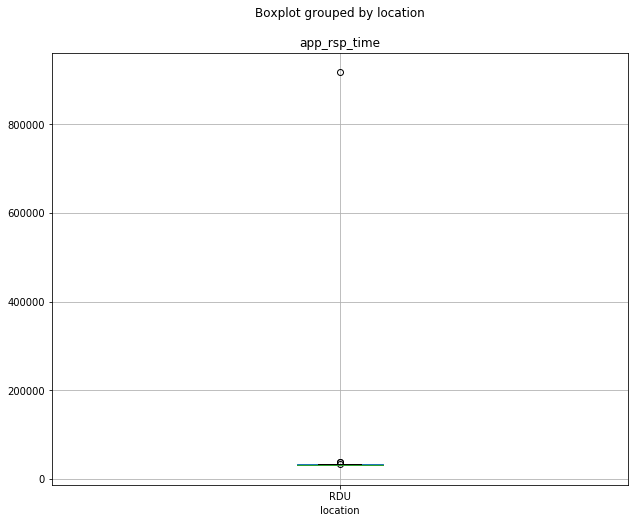

In [103]:
fig, ax = plt.subplots(figsize=(10,8))
plt.suptitle('')
appid_datapoint_outlook.boxplot(column=['app_rsp_time'], by='location', ax=ax)
plt.show()

#### 2.4 time_stamp count

In [80]:
appid_datapoint_outlook.time_stamp_x.value_counts()

1510599600000    3
1510603200000    3
1510689600000    3
1510610400000    3
1510581600000    3
1510596000000    3
1517749200000    3
1510671600000    3
1517878800000    2
1516680000000    2
1517900400000    2
1514628000000    2
1513486800000    2
1512172800000    2
1511604000000    2
1510628400000    2
1517540400000    2
1515772800000    2
1514984400000    2
1513332000000    2
1512658800000    2
1515646800000    2
1511812800000    2
1512907200000    2
1517407200000    2
1516021200000    2
1514404800000    2
1513940400000    2
1512612000000    2
1511607600000    2
1511341200000    2
1512939600000    2
1518048000000    2
1511791200000    2
1512957600000    2
1516129200000    2
1515132000000    2
1514077200000    2
1512734400000    2
1511496000000    2
1511334000000    2
1517929200000    2
1516305600000    2
1515027600000    2
1513922400000    2
1512068400000    2
1515510000000    2
1516093200000    2
1516716000000    2
1514851200000    2
1513782000000    2
1512712800000    2
151155720000

In [111]:
appid_datapoint_outlook.time_stamp_x.nunique()

27

In [105]:
conn.close()
conn = connect_to_mysql()
with conn.cursor() as cursor:
        # Read a  record
        sql = "select * from appid_datapoint where  app_rsp_time>0 and source in ( '10.6.1.101' ) "
        cursor.execute(sql) 
        appid_datapoint_src = pd.DataFrame(cursor.fetchall())

In [106]:
appid_datapoint_src.shape

(9670837, 16)

In [107]:
appid_datapoint_src.application.value_counts()

DNS                                                 1514120
Extreme Networks                                    1212929
Microsoft System Center Configuration Manager       1039010
Skype for Business                                   699717
CIFS                                                 605114
DCERPC                                               575801
LDAP                                                 424475
Kerberos                                             413281
NTLMSSP                                              197607
Encrypted Web                                        169554
Outlook Office365                                    163829
Outlook                                              162566
DHCP                                                 134405
CommVault                                            122631
SSH                                                   83922
Microsoft Corp                                        77381
Google                                  

In [108]:
appid_datapoint_src.target_attribute_id.value_counts()

233531624    16
229619720    15
231478682    15
218280080    15
235091833    15
235576456    15
232125307    15
236213310    15
219944862    15
235087477    14
233531760    14
233542054    14
235964115    14
235916228    14
232089184    14
224209868    14
233855189    14
232115320    14
222588508    14
227097051    14
235133983    14
233935318    14
231289960    14
233575843    14
230724432    14
230724394    14
235358969    14
230692617    14
221087047    14
232100138    14
235992952    14
234032754    14
233575759    14
232125215    14
235059111    14
232322855    14
235270030    14
235032494    14
235339634    14
225965521    14
236249043    14
233591194    14
232659671    14
230459426    14
236232408    14
235288624    14
235640524    14
234053677    14
231198077    14
233521064    14
235589346    14
233626076    14
231048891    14
235981006    14
220760946    14
232077989    14
236240258    14
230799168    14
235087490    14
219984169    14
235936010    14
227086440    14
22300465

In [110]:
appid_datapoint_src.target_address.value_counts()

10.6.16.140/                                     18358
10.6.17.63/                                      16496
134.141.77.27/                                   15920
10.6.113.59/                                     15852
10.6.105.21/SDN4s-Mac-Pro                        15200
10.6.17.58/                                      14736
10.6.25.230/                                     14453
10.120.89.114/                                   14375
10.6.105.37/dschudel-pc                          14310
10.6.17.64/                                      14244
10.6.114.49/laithssain-pc                        14210
10.6.25.120/                                     14156
10.6.105.62/bpeabody-pc1                         13944
10.120.89.113/                                   13897
134.141.77.26/                                   13859
134.141.16.126/                                  13822
10.6.16.159/                                     13807
10.6.106.21/ldernosek-pc1                        13678
10.6.105.4

### 3. full 10 days data fetching of 4 applications

In [ ]:
with conn.cursor() as cursor:
        # Read a  record
        sql = "select * from appid_datapoint where time_stamp>="+str(new_max1)+" and application in ('Outlook', 'Microsoft Office365' , 'Skype for Business'  , 'Salesforce' ) and app_rsp_time>0 "
        cursor.execute(sql)
        appid_datapoint_10days = pd.DataFrame(cursor.fetchall())
               

In [1399]:
appid_datapoint_10days.shape

(1986305, 16)

In [168]:
appid_datapoint_10days.to_csv("appid_datapoint_10days.csv",index=False)

In [16]:
appid_datapoint_10days = pd.read_csv('appid_datapoint_10days.csv')

In [17]:
appid_datapoint_10days.head()

,app_rsp_time,application,applicationgroup,byte_count,flow_count,rx_byte_count,rx_flow_count,source,target_address,target_attribute_id,tcp_rsp_time,time_stamp,tx_byte_count,tx_flow_count,user_data,zone
0,2432,Skype for Business,Real Time and Cloud Communications,69339,48,50272,24,10.6.1.101,134.141.112.82/pmo-lab-pc,214749649,104,1510358400000,19067,24,NaN,NaN
1,50633,Skype for Business,Real Time and Cloud Communications,1932932,1268,1118692,645,10.6.1.101,134.141.124.11/,214749652,49653,1510358400000,814240,623,NaN,NaN
2,29271,Skype for Business,Real Time and Cloud Communications,34601,90,23091,44,10.6.1.101,10.6.105.45/psadej-pc,214749654,27431,1510358400000,11510,46,NaN,NaN
3,32131,Microsoft Office365,Cloud Computing,84914,8,65197,4,10.6.1.101,10.6.105.45/psadej-pc,214749654,27129,1510358400000,19717,4,NaN,NaN
4,30767,Outlook,Mail,32312,6,17816,3,10.6.1.101,10.6.105.45/psadej-pc,214749654,26743,1510358400000,14496,3,NaN,NaN


In [18]:
def full_nunique(df):
    col = df.columns
    
    n=list()
    for c in col:
        n.append(df[c].nunique())
    df1 = pd.DataFrame({'column':col, 'n_unique':n})
    return df1

In [19]:
appid_datapoint_10days.application.value_counts()

Skype for Business     1343380
Outlook                 428727
Microsoft Office365     162700
Salesforce               51498
Name: application, dtype: int64

In [136]:
full_nunique(appid_datapoint_10days)

,column,n_unique
0,app_rsp_time,130485
1,application,4
2,applicationgroup,4
3,byte_count,658370
4,flow_count,22379
5,rx_byte_count,581444
6,rx_flow_count,15485
7,source,7
8,target_address,36940
9,target_attribute_id,1689366


In [65]:
a=appid_datapoint_10days.target_address.value_counts().sort_values(ascending=False)

In [66]:
type(a)

pandas.core.series.Series

In [67]:
a

10.120.89.113/                                             5913
10.6.16.182/                                               5716
10.6.16.183/                                               5705
10.6.16.181/                                               5647
10.6.31.25/                                                5591
134.141.77.26/                                             5535
10.120.89.114/                                             5304
134.141.97.151/hu10061002074.global.avaya.com              5053
10.6.17.63/                                                5012
10.6.17.64/                                                4942
134.141.36.60/                                             4734
10.6.16.140/                                               4666
134.141.124.11/                                            3806
134.141.123.60/gllee-PC                                    3742
134.141.77.77/usnh-lyncfe-p3                               3720
134.141.77.76/usnh-lyncfe-p2            

In [68]:
t_list = list(a.index[0:200])
t_list

['10.120.89.113/',
 '10.6.16.182/',
 '10.6.16.183/',
 '10.6.16.181/',
 '10.6.31.25/',
 '134.141.77.26/',
 '10.120.89.114/',
 '134.141.97.151/hu10061002074.global.avaya.com',
 '10.6.17.63/',
 '10.6.17.64/',
 '134.141.36.60/',
 '10.6.16.140/',
 '134.141.124.11/',
 '134.141.123.60/gllee-PC',
 '134.141.77.77/usnh-lyncfe-p3',
 '134.141.77.76/usnh-lyncfe-p2',
 '134.141.77.75/usnh-lyncfe-p1',
 '134.141.192.200/',
 '134.141.157.11/',
 '134.141.77.27/',
 '134.141.77.78/',
 '134.141.97.27/xx1211000460.global.avaya.com',
 '134.141.126.197/',
 '134.141.38.141/',
 '134.141.38.140/',
 '134.141.123.71/SZUGIC-PC',
 '134.141.36.61/',
 '10.6.105.47/mmitchell3-pc',
 '134.141.208.18/',
 '134.141.208.19/',
 '10.6.115.30/bparker-pc',
 '134.141.90.212/apettit-mac',
 '134.141.200.194/',
 '10.6.106.21/ldernosek-pc1',
 '10.6.99.169/',
 '10.6.104.71/lt-jcoates',
 '134.141.43.236/',
 '10.6.105.37/dschudel-pc',
 '134.141.77.76/usnh-lyncfe-p2.corp.extremenetworks.com',
 '10.6.98.44/WindowsCE',
 '134.141.77.77/usnh-

In [71]:
appid_datapoint_10days_5t = appid_datapoint_10days[appid_datapoint_10days.target_address.isin(t_list[0:5])]

In [10]:
max(appid_datapoint_10days[(appid_datapoint_10days.target_address=='10.120.89.113/') & (appid_datapoint_10days.source=='10.6.1.101') & (appid_datapoint_10days.application=='Skype for Business')].time_stamp.value_counts())

1

In [15]:
s_list=appid_datapoint_10days.source.unique()
t_list=appid_datapoint_10days.target_address.unique()
temp = appid_datapoint_10days[appid_datapoint_10days.application=='Salesforce']
for t in t_list:
    temp1 = temp[temp.target_address==t]
    for s in s_list:
        temp2 = temp1[temp1.source==s]
        if(len(temp2>0)):
            print(max(temp2.time_stamp.value_counts()))

1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


In [72]:
appid_datapoint_10days_5t.target_address.value_counts()

10.120.89.113/    5913
10.6.16.182/      5716
10.6.16.183/      5705
10.6.16.181/      5647
10.6.31.25/       5591
Name: target_address, dtype: int64

In [73]:
appid_datapoint_10days_5t.application.value_counts()

Skype for Business     28551
Microsoft Office365       13
Outlook                    8
Name: application, dtype: int64

In [74]:
appid_datapoint_10days.application.value_counts()

Skype for Business     1343380
Outlook                 428727
Microsoft Office365     162700
Salesforce               51498
Name: application, dtype: int64

#### For 4 apps seperatly 

In [75]:
appid_datapoint_10days_5t_outlook = appid_datapoint_10days_5t[appid_datapoint_10days_5t.application=='Skype for Business']

In [76]:
appid_datapoint_10days_5t_outlook

,app_rsp_time,application,applicationgroup,byte_count,flow_count,rx_byte_count,rx_flow_count,source,target_address,target_attribute_id,tcp_rsp_time,time_stamp,tx_byte_count,tx_flow_count,user_data,zone
25,165,Skype for Business,Real Time and Cloud Communications,95563,275,61644,85,10.6.1.101,10.6.31.25/,214749844,23,1510358400000,33919,190,NaN,NaN
290,1942,Skype for Business,Real Time and Cloud Communications,848638,894,320634,447,134.141.208.230,10.120.89.113/,214751456,5567,1510358400000,528004,447,NaN,NaN
292,242818,Skype for Business,Real Time and Cloud Communications,153738,26,54722,14,134.141.208.230,10.6.16.183/,214751525,237138,1510358400000,99016,12,NaN,NaN
343,240536,Skype for Business,Real Time and Cloud Communications,6128,12,3991,6,134.141.208.230,10.6.31.25/,214751786,237576,1510358400000,2137,6,NaN,NaN
344,244343,Skype for Business,Real Time and Cloud Communications,147040,22,43340,11,134.141.208.230,10.6.16.181/,214751792,237051,1510358400000,103700,11,NaN,NaN
346,248654,Skype for Business,Real Time and Cloud Communications,110610,16,30282,8,134.141.208.230,10.6.16.182/,214751813,237519,1510358400000,80328,8,NaN,NaN
383,75005,Skype for Business,Real Time and Cloud Communications,104936568,10784,88594941,5332,134.141.115.101,10.6.16.182/,214752716,63892,1510358400000,16341627,5452,NaN,NaN
393,74676,Skype for Business,Real Time and Cloud Communications,21727305,7107,6158434,3395,134.141.115.101,10.6.16.183/,214752726,67843,1510358400000,15568871,3712,NaN,NaN
395,51249,Skype for Business,Real Time and Cloud Communications,13067822,6305,3134822,3118,134.141.115.101,10.6.16.181/,214752731,46737,1510358400000,9933000,3187,NaN,NaN
417,55710,Skype for Business,Real Time and Cloud Communications,85828,24,42254,10,134.141.115.101,10.120.89.113/,214752782,52055,1510358400000,43574,14,NaN,NaN


In [77]:
appid_datapoint_10days_5t_outlook.target_address.value_counts()

10.120.89.113/    5913
10.6.16.182/      5716
10.6.16.183/      5704
10.6.16.181/      5627
10.6.31.25/       5591
Name: target_address, dtype: int64

In [78]:
appid_datapoint_10days_5t_outlook.source.value_counts()

10.6.1.101         9352
134.141.5.104      8171
134.141.115.101    5239
134.141.208.230    3963
134.141.121.91     1027
134.141.5.102       767
134.141.224.29       32
Name: source, dtype: int64

In [79]:
appid_datapoint_10days_5t_outlook.time_stamp.value_counts()

1512072000000    23
1516132800000    22
1516723200000    22
1511964000000    22
1512050400000    22
1511960400000    22
1511892000000    22
1516118400000    22
1516129200000    22
1516125600000    22
1516111200000    22
1512079200000    22
1511431200000    21
1516122000000    21
1511305200000    21
1511280000000    21
1516197600000    21
1517425200000    21
1511967600000    21
1511881200000    21
1516107600000    21
1512057600000    21
1516114800000    21
1511388000000    21
1511377200000    21
1511384400000    21
1511874000000    21
1510675200000    20
1511334000000    20
1510779600000    20
1512061200000    20
1511362800000    20
1510653600000    20
1518098400000    20
1510657200000    20
1512054000000    20
1511877600000    20
1512075600000    20
1510790400000    20
1511355600000    20
1511316000000    20
1511899200000    20
1510678800000    20
1517839200000    20
1510664400000    20
1511863200000    20
1510362000000    20
1511330400000    20
1510585200000    20
1510783200000    20


In [80]:
full_nunique(appid_datapoint_10days_5t_outlook)

,column,n_unique
0,app_rsp_time,22666
1,application,1
2,applicationgroup,1
3,byte_count,26461
4,flow_count,14627
5,rx_byte_count,26270
6,rx_flow_count,11126
7,source,7
8,target_address,5
9,target_attribute_id,28551


In [81]:
appid_datapoint_10days_5t.shape

(28572, 16)

In [82]:
dates = appid_datapoint_10days_5t_outlook.time_stamp.astype(int)
dates_outlook =pd.to_datetime(pd.Series(dates),unit='ms')
#max_time['date'] = tem
dates_outlook
#new_dates

25        2017-11-11 00:00:00
290       2017-11-11 00:00:00
292       2017-11-11 00:00:00
343       2017-11-11 00:00:00
344       2017-11-11 00:00:00
346       2017-11-11 00:00:00
383       2017-11-11 00:00:00
393       2017-11-11 00:00:00
395       2017-11-11 00:00:00
417       2017-11-11 00:00:00
533       2017-11-11 00:00:00
561       2017-11-11 00:00:00
564       2017-11-11 00:00:00
567       2017-11-11 00:00:00
572       2017-11-11 00:00:00
789       2017-11-11 00:00:00
962       2017-11-11 00:00:00
963       2017-11-11 00:00:00
964       2017-11-11 00:00:00
989       2017-11-11 00:00:00
1055      2017-11-11 01:00:00
1056      2017-11-11 01:00:00
1060      2017-11-11 01:00:00
1061      2017-11-11 01:00:00
1377      2017-11-11 01:00:00
1383      2017-11-11 01:00:00
1384      2017-11-11 01:00:00
1398      2017-11-11 01:00:00
1479      2017-11-11 01:00:00
1612      2017-11-11 01:00:00
1747      2017-11-11 01:00:00
1756      2017-11-11 01:00:00
1765      2017-11-11 01:00:00
1814      

In [85]:
plot_test(dates_outlook,appid_datapoint_10days_5t_outlook[appid_datapoint_10days_5t_outlook.target_address=='10.120.89.113/'].app_rsp_time,'hi')

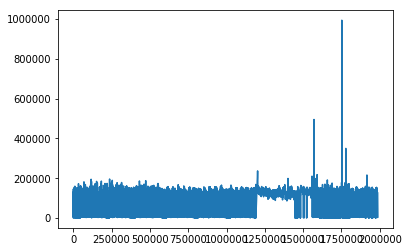

In [84]:
plt.plot(appid_datapoint_10days_5t_outlook[appid_datapoint_10days_5t_outlook.target_address=='10.120.89.113/'].app_rsp_time)
plt.show()

In [86]:
z= appid_datapoint_10days_5t_outlook[appid_datapoint_10days_5t_outlook.target_address=='10.120.89.113/']
z.time_stamp.value_counts()

1511647200000    4
1511780400000    4
1511668800000    4
1516068000000    4
1518040800000    4
1510614000000    4
1518112800000    4
1510725600000    4
1512057600000    4
1510444800000    4
1516172400000    4
1510545600000    4
1511928000000    4
1511546400000    4
1510714800000    4
1516183200000    4
1510758000000    4
1518159600000    4
1511283600000    4
1511773200000    4
1510664400000    4
1511888400000    4
1518084000000    4
1511560800000    4
1518030000000    4
1511938800000    4
1510556400000    4
1511870400000    4
1512093600000    4
1510488000000    4
1511557200000    4
1511564400000    4
1511524800000    4
1518123600000    4
1511460000000    4
1511553600000    4
1511398800000    4
1511658000000    4
1511740800000    4
1511722800000    4
1516129200000    4
1511906400000    4
1510524000000    4
1511730000000    4
1512082800000    4
1511478000000    4
1510657200000    4
1511280000000    4
1516719600000    4
1510466400000    4
1511848800000    4
1516075200000    4
151076520000

In [87]:
z1 = z[z.source=='134.141.5.104']
z2 = z[z.source=='10.6.1.101']
z3 = z[z.source=='134.141.115.101']
z1.shape

(1782, 16)

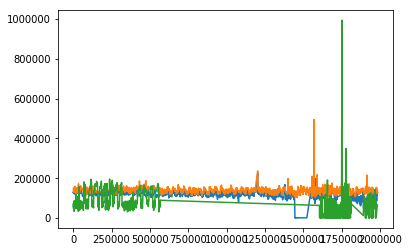

In [88]:
plt.plot(z1.app_rsp_time)
plt.plot(z2.app_rsp_time)
plt.plot(z3.app_rsp_time)
plt.show()

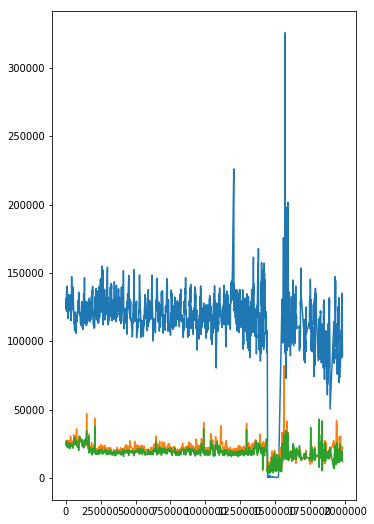

In [102]:
zt2= appid_datapoint_10days_5t_outlook[appid_datapoint_10days_5t_outlook.target_address=='10.6.16.182/']
zt21 = zt2[zt2.source=='134.141.5.104']
zt3= appid_datapoint_10days_5t_outlook[appid_datapoint_10days_5t_outlook.target_address=='10.6.16.183/']
zt31 = zt3[zt3.source=='134.141.5.104']
plt.plot(z1.app_rsp_time)
plt.plot(zt21.app_rsp_time)
plt.plot(zt31.app_rsp_time)
plt.show()

In [103]:
x = list(range(len(z1)))
plot_test1(x,z1.app_rsp_time,'office 360')

Loading BokehJS ...

In [91]:
ewma = pd.stats.moments.ewma
def smooth(data,lag=5):
    
    x=data.app_rsp_time
    # take EWMA in both directions with a smaller span term
    fwd = ewma( x, span=lag ) # take EWMA in fwd direction
    bwd = ewma( x[::-1], span=lag ) # take EWMA in bwd direction
    c = np.vstack(( fwd, bwd[::-1] )) # lump fwd and bwd together
    c = np.mean( c, axis=0 ) # average
       
    return c

In [92]:
sm = smooth(z1)

/root/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: FutureWarning:

pd.ewm_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.ewm(span=5,min_periods=0,adjust=True,ignore_na=False).mean()

/root/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: FutureWarning:

pd.ewm_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.ewm(span=5,min_periods=0,adjust=True,ignore_na=False).mean()



In [93]:
from bokeh.models import HoverTool
dates = z1.time_stamp.astype(int)
dates_outlook =pd.to_datetime(pd.Series(dates),unit='ms')

z1['date'] = dates_outlook
z1['smooth'] = sm
z1['delta'] = z1.app_rsp_time-z1.smooth

/root/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

/root/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

/root/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#i

In [20]:
    hover =HoverTool(
    tooltips=[
        ( 'date',   '@date{%F}'            ),
        ( 'real',  '@{app_rsp_time}{%0.2f}' ), # use @{ } for field names with spaces
        ( 'smoothed',  '@{smooth}{%0.2f}' ),
        ( 'delta',  '@{delta}{%0.2f}' ),
        
        
        #( 'volume', '@volume{0.00 a}'      ),
    ],

    formatters={
        'date'      : 'datetime', # use 'datetime' formatter for 'date' field
        'app_rsp_time' : 'printf',
        'smooth' : 'printf',
        'delta' : 'printf',
        
        # use 'printf' formatter for 'adj close' field
                                  # use default 'numeral' formatter for other fields
    },

    # display a tooltip whenever the cursor is vertically in line with a glyph
    mode='vline'
)
    
    tools = 'pan,wheel_zoom,xbox_select,reset'
    
    label1=z1.date
        
    output_notebook()
    p=figure(title='smoothed',plot_height = 600 ,plot_width =800,tools=[tools,hover])
    
    p.line('date','app_rsp_time',source=z1,color='orange')
    p.line('date','smooth',source=z1,color='blue')
    show(p)
    

NameError: name 'HoverTool' is not defined

In [95]:
from sklearn.metrics import mean_squared_error as mse
import math

print("rmse = ",math.sqrt(mse(z1.app_rsp_time,z1.smooth)))

rmse =  7950.427233029275


In [96]:
z1['ape']=abs(z1.delta/z1.app_rsp_time)*100

/root/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [97]:
print("mape = ",z1.ape.mean())

mape =  25.04006707481109


In [98]:
max(z1.time_stamp.value_counts())

1

#### finding ACF

In [104]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.stattools import acf, pacf
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 12
fig_size[1] = 9
plt.rcParams["figure.figsize"] = fig_size

In [105]:
lag_acf = acf(zt31.app_rsp_time, nlags=300)

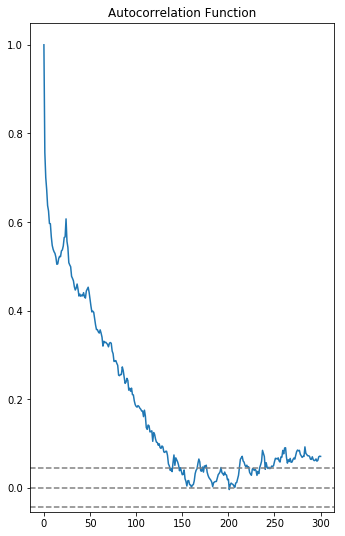

In [106]:
#Plot ACF: 
plt.subplot(121) 
plt.plot(lag_acf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(zt31.app_rsp_time)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(zt31.app_rsp_time)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')
plt.show()

In [107]:
lag_acf_df = pd.DataFrame(lag_acf)
lag_acf_df1 = lag_acf_df.reset_index()
lag_acf_df1[lag_acf_df1>.5].dropna().index

Int64Index([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
            18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28],
           dtype='int64')

In [108]:
appid_datapoint_10days_5t.shape

(28572, 16)

In [109]:
zt31.shape

(1930, 16)

In [110]:
z1 = z[z.time_stamp==1511647200000]
z1

,app_rsp_time,application,applicationgroup,byte_count,flow_count,rx_byte_count,rx_flow_count,source,target_address,target_attribute_id,tcp_rsp_time,time_stamp,tx_byte_count,tx_flow_count,user_data,zone
381929,129521,Skype for Business,Real Time and Cloud Communications,6509663,4342,3603115,2240,134.141.5.104,10.120.89.113/,217832300,127177,1511647200000,2906548,2102,NaN,NaN
382289,128127,Skype for Business,Real Time and Cloud Communications,9311033,3838,3922498,1908,10.6.1.101,10.120.89.113/,217836795,126229,1511647200000,5388535,1930,NaN,NaN
382627,77316,Skype for Business,Real Time and Cloud Communications,181022,48,90910,26,134.141.115.101,10.120.89.113/,217839051,73180,1511647200000,90112,22,NaN,NaN
382741,1630,Skype for Business,Real Time and Cloud Communications,557053,704,241585,354,134.141.208.230,10.120.89.113/,217839899,315,1511647200000,315468,350,NaN,NaN


In [111]:
appid_datapoint_1t_1s_outlook = z1.copy()

In [112]:
dates1 = appid_datapoint_1t_1s_outlook.time_stamp.astype(int)
dates_outlook1 =pd.to_datetime(pd.Series(dates1),unit='ms')
appid_datapoint_1t_1s_outlook['datetime']= dates_outlook1
appid_datapoint_1t_1s_outlook['date']= dates_outlook1.dt.date
appid_datapoint_1t_1s_outlook['hour']= dates_outlook1.dt.hour


In [113]:
appid_datapoint_1t_1s_outlook.head()

,app_rsp_time,application,applicationgroup,byte_count,flow_count,rx_byte_count,rx_flow_count,source,target_address,target_attribute_id,tcp_rsp_time,time_stamp,tx_byte_count,tx_flow_count,user_data,zone,datetime,date,hour
381929,129521,Skype for Business,Real Time and Cloud Communications,6509663,4342,3603115,2240,134.141.5.104,10.120.89.113/,217832300,127177,1511647200000,2906548,2102,NaN,NaN,2017-11-25 22:00:00,2017-11-25,22
382289,128127,Skype for Business,Real Time and Cloud Communications,9311033,3838,3922498,1908,10.6.1.101,10.120.89.113/,217836795,126229,1511647200000,5388535,1930,NaN,NaN,2017-11-25 22:00:00,2017-11-25,22
382627,77316,Skype for Business,Real Time and Cloud Communications,181022,48,90910,26,134.141.115.101,10.120.89.113/,217839051,73180,1511647200000,90112,22,NaN,NaN,2017-11-25 22:00:00,2017-11-25,22
382741,1630,Skype for Business,Real Time and Cloud Communications,557053,704,241585,354,134.141.208.230,10.120.89.113/,217839899,315,1511647200000,315468,350,NaN,NaN,2017-11-25 22:00:00,2017-11-25,22


In [114]:
appid_datapoint_1t_1s_outlook.head()

,app_rsp_time,application,applicationgroup,byte_count,flow_count,rx_byte_count,rx_flow_count,source,target_address,target_attribute_id,tcp_rsp_time,time_stamp,tx_byte_count,tx_flow_count,user_data,zone,datetime,date,hour
381929,129521,Skype for Business,Real Time and Cloud Communications,6509663,4342,3603115,2240,134.141.5.104,10.120.89.113/,217832300,127177,1511647200000,2906548,2102,NaN,NaN,2017-11-25 22:00:00,2017-11-25,22
382289,128127,Skype for Business,Real Time and Cloud Communications,9311033,3838,3922498,1908,10.6.1.101,10.120.89.113/,217836795,126229,1511647200000,5388535,1930,NaN,NaN,2017-11-25 22:00:00,2017-11-25,22
382627,77316,Skype for Business,Real Time and Cloud Communications,181022,48,90910,26,134.141.115.101,10.120.89.113/,217839051,73180,1511647200000,90112,22,NaN,NaN,2017-11-25 22:00:00,2017-11-25,22
382741,1630,Skype for Business,Real Time and Cloud Communications,557053,704,241585,354,134.141.208.230,10.120.89.113/,217839899,315,1511647200000,315468,350,NaN,NaN,2017-11-25 22:00:00,2017-11-25,22


In [115]:
def features(df,lag):
    df.index = list(range(len(df)))
    m1=list()
    sd1=list()
    for i in range(lag,len(df)):
        t1 = df.datetime[i]
        t2 = t1-datetime.timedelta(hours=lag)
        temp1 = df[df.datetime>=t2]
        temp2 = temp1[temp1.datetime<t1]
        m1.append(temp2.app_rsp_time.mean())
        sd1.append(temp2.app_rsp_time.std())
    return m1,sd1

In [116]:
def shifter(y,forcast_lag):
    
    y1=y.shift(-forcast_lag)
    
    y1 = y1[0:len(y1)-forcast_lag]
    return y1

In [117]:
m1,sd1 = features(appid_datapoint_1t_1s_outlook,5)

In [118]:
print(len(m1),len(df))

NameError: name 'df' is not defined

In [119]:
new_df = appid_datapoint_1t_1s_outlook.copy()
j=0

In [907]:
for i in range(1,28):
    #m1,sd1 = features(appid_datapoint_1t_1s_outlook,i)
    #new_df = new_df.iloc[(i-j):len(new_df),:]
    sh = 'shift_'+str(i)
    #ma='ma'+str(i)
    #sd='sd'+str(i)
    shift = shifter(appid_datapoint_1t_1s_outlook.app_rsp_time,i)
    new_df = new_df.iloc[0:len(shift),:]
    new_df[sh] = shift
    #new_df[ma] = m1
    #new_df[sd] = sd1
    #j=i

In [910]:
m1,sd1 = features(new_df,5)
m2,sd2 = features(new_df,20)
new_df = new_df.iloc[5:len(new_df),:]
new_df['ma5'] = m1
new_df['sd5'] = sd1
new_df = new_df.iloc[15:len(new_df),:]
new_df['ma20'] = m2
new_df['sd20'] = sd2


In [911]:
new_df.head()

,app_rsp_time,application,applicationgroup,byte_count,flow_count,rx_byte_count,rx_flow_count,source,target_address,target_attribute_id,tcp_rsp_time,time_stamp,tx_byte_count,tx_flow_count,user_data,zone,datetime,date,hour,shift_1,shift_2,shift_3,shift_4,shift_5,shift_6,shift_7,shift_8,shift_9,shift_10,shift_11,shift_12,shift_13,shift_14,shift_15,shift_16,shift_17,shift_18,shift_19,shift_20,shift_21,shift_22,shift_23,shift_24,shift_25,shift_26,shift_27,ma5,sd5,ma20,sd20
20,122979,Skype for Business,Real Time and Cloud Communications,5055605,5033,2338987,2532,134.141.5.104,10.120.89.113/,214917455,121105,1510430400000,2716618,2501,None,None,2017-11-11 20:00:00,2017-11-11,20,132422.0,128151.0,133589.0,129208.0,133806.0,131845.0,129212.0,133287.0,129906.0,133227.0,127040.0,124429.0,131594.0,122621.0,121888.0,133948.0,125121.0,121878.0,130850.0,114959.0,122716.0,131810.0,124065.0,121074.0,121020.0,147340.0,128723.0,123829.6,7319.483609,126527.30,5948.198339
21,132422,Skype for Business,Real Time and Cloud Communications,5653935,5120,2823981,2609,134.141.5.104,10.120.89.113/,214925566,129479,1510434000000,2829954,2511,None,None,2017-11-11 21:00:00,2017-11-11,21,128151.0,133589.0,129208.0,133806.0,131845.0,129212.0,133287.0,129906.0,133227.0,127040.0,124429.0,131594.0,122621.0,121888.0,133948.0,125121.0,121878.0,130850.0,114959.0,122716.0,131810.0,124065.0,121074.0,121020.0,147340.0,128723.0,125716.0,124373.8,7084.945074,126325.35,5999.009465
22,128151,Skype for Business,Real Time and Cloud Communications,5568336,5064,2822199,2589,134.141.5.104,10.120.89.113/,214933680,125589,1510437600000,2746137,2475,None,None,2017-11-11 22:00:00,2017-11-11,22,133589.0,129208.0,133806.0,131845.0,129212.0,133287.0,129906.0,133227.0,127040.0,124429.0,131594.0,122621.0,121888.0,133948.0,125121.0,121878.0,130850.0,114959.0,122716.0,131810.0,124065.0,121074.0,121020.0,147340.0,128723.0,125716.0,129569.0,127527.6,6249.325668,126394.60,6063.904252
23,133589,Skype for Business,Real Time and Cloud Communications,4906920,4742,2339814,2465,134.141.5.104,10.120.89.113/,214941730,131603,1510441200000,2567106,2277,None,None,2017-11-11 23:00:00,2017-11-11,23,129208.0,133806.0,131845.0,129212.0,133287.0,129906.0,133227.0,127040.0,124429.0,131594.0,122621.0,121888.0,133948.0,125121.0,121878.0,130850.0,114959.0,122716.0,131810.0,124065.0,121074.0,121020.0,147340.0,128723.0,125716.0,129569.0,137123.0,127477.8,6241.623002,126535.70,6070.632561
24,129208,Skype for Business,Real Time and Cloud Communications,4797316,4665,2182588,2353,134.141.5.104,10.120.89.113/,214950022,127647,1510444800000,2614728,2312,None,None,2017-11-12 00:00:00,2017-11-12,0,133806.0,131845.0,129212.0,133287.0,129906.0,133227.0,127040.0,124429.0,131594.0,122621.0,121888.0,133948.0,125121.0,121878.0,130850.0,114959.0,122716.0,131810.0,124065.0,121074.0,121020.0,147340.0,128723.0,125716.0,129569.0,137123.0,123550.0,130295.6,4739.011479,126704.70,6223.401093


In [912]:
new_df.corr()

,app_rsp_time,byte_count,flow_count,rx_byte_count,rx_flow_count,target_attribute_id,tcp_rsp_time,time_stamp,tx_byte_count,tx_flow_count,hour,shift_1,shift_2,shift_3,shift_4,shift_5,shift_6,shift_7,shift_8,shift_9,shift_10,shift_11,shift_12,shift_13,shift_14,shift_15,shift_16,shift_17,shift_18,shift_19,shift_20,shift_21,shift_22,shift_23,shift_24,shift_25,shift_26,shift_27,ma5,sd5,ma20,sd20
app_rsp_time,1.000000,0.086365,0.247674,0.089305,0.254493,-0.390839,0.950640,-0.391815,0.072486,0.240401,-0.071424,0.754245,0.696407,0.667132,0.617730,0.593462,0.548212,0.489883,0.449168,0.411558,0.380470,0.361241,0.340525,0.329687,0.331245,0.311861,0.321125,0.327119,0.317374,0.336273,0.337428,0.305833,0.302616,0.279303,0.301912,0.254072,0.212486,0.152255,0.779577,-0.033532,0.717744,-0.121689
byte_count,0.086365,1.000000,0.474493,0.926788,0.473971,-0.067214,0.093049,-0.064588,0.938156,0.474321,0.105903,0.060936,0.029500,0.006861,0.002092,-0.014036,-0.025952,-0.035225,-0.025664,-0.013485,0.000179,0.018075,0.034423,0.051203,0.076843,0.098402,0.108098,0.112147,0.119332,0.109587,0.081814,0.064724,0.054654,0.015765,0.001346,-0.007486,-0.011996,-0.036640,0.154688,0.043744,0.085001,0.019302
flow_count,0.247674,0.474493,1.000000,0.459768,0.999276,-0.358242,0.275547,-0.353953,0.426700,0.999257,0.177204,0.221113,0.207143,0.198069,0.173139,0.153943,0.141867,0.134187,0.134588,0.144444,0.161220,0.175072,0.190102,0.203593,0.221693,0.228198,0.236412,0.232377,0.228912,0.219074,0.195369,0.171391,0.160036,0.128698,0.083577,0.064580,0.041630,0.021581,0.333778,-0.002268,0.294867,-0.056387
rx_byte_count,0.089305,0.926788,0.459768,1.000000,0.459945,-0.062624,0.097468,-0.060235,0.739439,0.458910,0.089177,0.062965,0.034294,0.012662,0.007478,-0.007225,-0.014311,-0.029069,-0.023387,-0.009116,-0.000656,0.015218,0.033680,0.050720,0.078609,0.100952,0.114008,0.117948,0.124271,0.108898,0.076242,0.059883,0.050678,0.017653,0.003520,-0.002256,-0.008238,-0.033504,0.147754,0.028837,0.082541,0.014693
rx_flow_count,0.254493,0.473971,0.999276,0.459945,1.000000,-0.365508,0.283246,-0.361121,0.425602,0.997067,0.172692,0.226460,0.211328,0.201691,0.176149,0.157459,0.144429,0.135702,0.135594,0.145716,0.161130,0.174645,0.190384,0.203146,0.221761,0.228261,0.236771,0.233361,0.231015,0.221993,0.198169,0.174662,0.164212,0.133089,0.088986,0.069671,0.046986,0.025634,0.337784,-0.008141,0.296693,-0.063864
target_attribute_id,-0.390839,-0.067214,-0.358242,-0.062624,-0.365508,1.000000,-0.443756,0.999539,-0.062753,-0.350352,-0.001008,-0.389162,-0.388609,-0.389528,-0.389840,-0.390114,-0.390827,-0.391075,-0.391817,-0.392473,-0.392379,-0.392339,-0.392414,-0.393221,-0.393878,-0.394230,-0.394704,-0.394347,-0.394590,-0.395119,-0.394134,-0.394274,-0.393705,-0.393217,-0.392350,-0.390912,-0.391284,-0.391611,-0.442921,0.256647,-0.505896,0.342987
tcp_rsp_time,0.950640,0.093049,0.275547,0.097468,0.283246,-0.443756,1.000000,-0.444444,0.076941,0.267342,-0.087030,0.799260,0.736612,0.703205,0.660507,0.628989,0.580475,0.525109,0.489754,0.455882,0.416321,0.395030,0.373995,0.357100,0.357355,0.343548,0.345267,0.349742,0.345068,0.346037,0.351317,0.331416,0.317677,0.302542,0.304356,0.273731,0.238538,0.175530,0.815148,-0.048512,0.753912,-0.144767
time_stamp,-0.391815,-0.064588,-0.353953,-0.060235,-0.361121,0.999539,-0.444444,1.000000,-0.060248,-0.346168,-0.001130,-0.390184,-0.389693,-0.390653,-0.391027,-0.391313,-0.392074,-0.392322,-0.393070,-0.393737,-0.393627,-0.393575,-0.393610,-0.394382,-0.394983,-0.395267,-0.395693,-0.395267,-0.395476,-0.395980,-0.394959,-0.395102,-0.394556,-0.394072,-0.393235,-0.391856,-0.392296,-0.392611,-0.444307,0.254772,-0.507661,0.339846
tx_byte_count,0.072486,0.938156,0.426700,0.739439,0.425602,-0.062753,0.076941,-0.060248,1.000000,0.427183,0.107625,0.051185,0.021265,0.000626,-0.003143,-0.018500,-0.033326,-0.036345,-0.024443,-0.015769,0.000926,0.018370,0.030656,0.045026,0.065277,0.083325,0.088669,0.092294,0.099346,0.096049,0.076370,0.060816,0.051251,0.011985,-0.000832,-0.011339,-0.013907,-0.

## 4. LSTM modelling

In [307]:
from keras.layers import Dense,LSTM,Dropout
from keras.models import Sequential
import numpy as np
from keras.callbacks import TensorBoard
from time import time

from sklearn.preprocessing import MinMaxScaler

import math 
from sklearn.metrics import mean_squared_error
from tensorflow import set_random_seed
from sklearn.preprocessing import RobustScaler

/root/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:34: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.

Using TensorFlow backend.


In [583]:
len(t_list)

286

### 4.1 data set preperation

In [608]:
appid_datapoint_10days.target_address.nunique()

36940

In [126]:
appid_datapoint_10days_outlook=appid_datapoint_10days.loc[appid_datapoint_10days.application=='Outlook',:]

appid_datapoint_10days_outlook.shape

(428727, 16)

In [127]:
appid_datapoint_10days_outlook.target_address.nunique()

18828

In [128]:
t_outlook_all=appid_datapoint_10days_outlook.target_address.value_counts()
#t_outlook_all.head()
t_outlook_1k=t_outlook_all.loc[t_outlook_all>1000]
t_outlook_1k.shape

(75,)

In [129]:
from tqdm import tqdm

In [913]:
#s
#appid_datapoint_1s_outlook = appid_datapoint_10days_outlook[appid_datapoint_10days_outlook.source== s_list[s]]
appid_datapoint_1s_outlook_mult = pd.DataFrame()
mega_test = pd.DataFrame()
for i in tqdm(range(0,30)):
    d = appid_datapoint_10days_outlook.loc[appid_datapoint_10days_outlook.target_address==t_outlook_1k.index[i]]  
    print(d.shape)
    dates1 = d.time_stamp.astype(int)
    dates_outlook1 =pd.to_datetime(pd.Series(dates1),unit='ms')
    d['datetime']= dates_outlook1
    d['date']= dates_outlook1.dt.date
    d['hour']= dates_outlook1.dt.hour
    s_list = d.source.unique()
    for j in s_list:
        d1 = d[d.source==j]
    
        m1,sd1 = features(d1,5)
        m2,sd2 = features(d1,24)
        new_df = d1.iloc[5:len(d1),:]
        new_df['ma5'] = m1
        new_df['sd5'] = sd1
        new_df = new_df.iloc[19:len(new_df),:]
        new_df['ma24'] = m2
        new_df['sd24'] = sd2
        for i in range(1,28):
    
            sh = 'shift_'+str(i)
    
            shift = shifter(new_df.app_rsp_time,i)
            new_df = new_df.iloc[0:len(shift),:]
            new_df[sh] = shift
    
        
        split = int(len(new_df)*.85)
        new_df2 = new_df.iloc[0:split,:]
        new_test = new_df.iloc[split:len(new_df),:]
    
        mega_test = mega_test.append((new_test))
    
        appid_datapoint_1s_outlook_mult = appid_datapoint_1s_outlook_mult.append(new_df2)



  0%|          | 0/30 [00:00<?, ?it/s]

(1874, 16)


/root/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

/root/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

/root/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.htm

(1874, 16)


  7%|▋         | 2/30 [00:31<07:21, 15.77s/it]

(1870, 16)


 10%|█         | 3/30 [00:47<07:05, 15.75s/it]

(1870, 16)


 13%|█▎        | 4/30 [01:02<06:48, 15.73s/it]

(1869, 16)


 17%|█▋        | 5/30 [01:18<06:32, 15.71s/it]

(1869, 16)


 20%|██        | 6/30 [01:34<06:19, 15.79s/it]

(1868, 16)


 23%|██▎       | 7/30 [01:51<06:06, 15.95s/it]

(1864, 16)


 27%|██▋       | 8/30 [02:07<05:50, 15.93s/it]

(1850, 16)


 30%|███       | 9/30 [02:23<05:34, 15.91s/it]

(1782, 16)


 33%|███▎      | 10/30 [02:38<05:17, 15.86s/it]

(1781, 16)


 37%|███▋      | 11/30 [02:53<05:00, 15.80s/it]

(1752, 16)


 40%|████      | 12/30 [03:09<04:43, 15.76s/it]

(1741, 16)


 43%|████▎     | 13/30 [03:24<04:27, 15.73s/it]

(1625, 16)


 47%|████▋     | 14/30 [03:39<04:10, 15.67s/it]

(1615, 16)


 50%|█████     | 15/30 [03:54<03:54, 15.61s/it]

(1603, 16)


 53%|█████▎    | 16/30 [04:09<03:38, 15.58s/it]

(1591, 16)


 57%|█████▋    | 17/30 [04:24<03:22, 15.57s/it]

(1565, 16)


 60%|██████    | 18/30 [04:39<03:06, 15.52s/it]

(1551, 16)


 63%|██████▎   | 19/30 [04:53<02:50, 15.47s/it]

(1549, 16)


 67%|██████▋   | 20/30 [05:08<02:34, 15.44s/it]

(1530, 16)


 70%|███████   | 21/30 [05:23<02:18, 15.39s/it]

(1517, 16)


 73%|███████▎  | 22/30 [05:38<02:02, 15.36s/it]

(1513, 16)


 77%|███████▋  | 23/30 [05:53<01:47, 15.35s/it]

(1481, 16)


 80%|████████  | 24/30 [06:07<01:31, 15.32s/it]

(1460, 16)


 83%|████████▎ | 25/30 [06:22<01:16, 15.30s/it]

(1439, 16)


 87%|████████▋ | 26/30 [06:36<01:01, 15.26s/it]

(1424, 16)


 90%|█████████ | 27/30 [06:50<00:45, 15.21s/it]

(1420, 16)


 93%|█████████▎| 28/30 [07:04<00:30, 15.17s/it]

(1416, 16)


 97%|█████████▋| 29/30 [07:18<00:15, 15.13s/it]

(1392, 16)


100%|██████████| 30/30 [07:32<00:00, 15.08s/it]


In [914]:
appid_datapoint_1s_outlook_mult.shape

(31855, 50)

In [915]:
d1 = pd.get_dummies(appid_datapoint_1s_outlook_mult.target_address)
appid_datapoint_1s_outlook_mult = pd.concat([appid_datapoint_1s_outlook_mult,d1],axis=1)

In [916]:
d1 = pd.get_dummies(appid_datapoint_1s_outlook_mult.source)
appid_datapoint_1s_outlook_mult = pd.concat([appid_datapoint_1s_outlook_mult,d1],axis=1)

In [917]:
d1 = pd.get_dummies(mega_test.target_address)
mega_test = pd.concat([mega_test,d1],axis=1)

In [918]:
d1 = pd.get_dummies(mega_test.source)
mega_test = pd.concat([mega_test,d1],axis=1)

In [919]:
mega_test.head(2)

,app_rsp_time,application,applicationgroup,byte_count,flow_count,rx_byte_count,rx_flow_count,source,target_address,target_attribute_id,tcp_rsp_time,time_stamp,tx_byte_count,tx_flow_count,user_data,zone,datetime,date,hour,ma5,sd5,ma24,sd24,shift_1,shift_2,shift_3,shift_4,shift_5,shift_6,shift_7,shift_8,shift_9,shift_10,shift_11,shift_12,shift_13,shift_14,shift_15,shift_16,shift_17,shift_18,shift_19,shift_20,shift_21,shift_22,shift_23,shift_24,shift_25,shift_26,shift_27,10.6.104.52/erovner,10.6.104.71/lt-jcoates,10.6.105.37/dschudel-pc,10.6.105.38/dt-dgrosser,10.6.105.39/gvervaert-pc,10.6.105.47/mmitchell3-pc,10.6.106.21/ldernosek-pc1,10.6.17.63/,10.6.17.64/,10.6.24.122/,10.6.98.22/WindowsCE,10.6.98.44/WindowsCE,10.6.99.145/WindowsCE,10.6.99.163/WindowsCE,10.6.99.164/WindowsCE,10.6.99.166/WindowsCE,10.6.99.169/,10.6.99.174/,10.6.99.25/WindowsCE,10.6.99.53/,10.6.99.87/WindowsCE,10.6.99.92/WindowsCE,10.6.99.97/WindowsCE,134.141.123.60/gllee-PC,134.141.123.71/SZUGIC-PC,134.141.90.109/jfiedler-pc7.corp.extremenetworks.com,134.141.90.204/achillar-pc.corp.extremenetworks.com,134.141.90.49/spanky.corp.extremenetworks.com,134.141.90.69/ddaigle-pc1.corp.extremenetworks.com,134.141.90.88/salemrecepti-pc,10.6.1.101,134.141.121.91,134.141.5.102,134.141.5.104
1275,55092,Outlook,Mail,106601537,636,2624657,319,10.6.1.101,10.6.17.64/,228605870,57464,1515448800000,103976880,317,None,None,2018-01-08 22:00:00,2018-01-08,22,64570.4,3472.085368,63743.250000,4667.976372,65664.0,62179.0,76070.0,71518.0,62011.0,52408.0,67156.0,62408.0,60512.0,63833.0,64292.0,65018.0,70500.0,60238.0,64882.0,64790.0,66414.0,60216.0,64533.0,64324.0,69014.0,62142.0,60903.0,63382.0,57728.0,63404.0,58058.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1276,65664,Outlook,Mail,77492352,670,2524050,333,10.6.1.101,10.6.17.64/,228618259,65031,1515452400000,74968302,337,None,None,2018-01-08 23:00:00,2018-01-08,23,63506.0,5364.726834,63796.958333,4554.674641,62179.0,76070.0,71518.0,62011.0,52408.0,67156.0,62408.0,60512.0,63833.0,64292.0,65018.0,70500.0,60238.0,64882.0,64790.0,66414.0,60216.0,64533.0,64324.0,69014.0,62142.0,60903.0,63382.0,57728.0,63404.0,58058.0,69481.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


In [920]:
mega_test.shape

(5640, 84)

In [921]:
cols=[0]
cols=cols+list(range(19,57))


In [922]:
need_df = appid_datapoint_1s_outlook_mult.iloc[:,cols].dropna()
need_df.head(2)

,app_rsp_time,ma5,sd5,ma24,sd24,shift_1,shift_2,shift_3,shift_4,shift_5,shift_6,shift_7,shift_8,shift_9,shift_10,shift_11,shift_12,shift_13,shift_14,shift_15,shift_16,shift_17,shift_18,shift_19,shift_20,shift_21,shift_22,shift_23,shift_24,shift_25,shift_26,shift_27,10.6.104.52/erovner,10.6.104.71/lt-jcoates,10.6.105.37/dschudel-pc,10.6.105.38/dt-dgrosser,10.6.105.39/gvervaert-pc,10.6.105.47/mmitchell3-pc,10.6.106.21/ldernosek-pc1
24,67993,64260.4,7077.493292,62698.875,5381.341883,59046.0,67965.0,60245.0,57057.0,68009.0,60150.0,67834.0,73142.0,67459.0,64889.0,62076.0,69907.0,64647.0,66858.0,61800.0,63412.0,62626.0,55632.0,59196.0,74874.0,64532.0,63181.0,69971.0,71681.0,70472.0,66386.0,64859.0,0,0,0,0,0,0,0
25,59046,65884.2,6742.992859,62646.250,5320.259623,67965.0,60245.0,57057.0,68009.0,60150.0,67834.0,73142.0,67459.0,64889.0,62076.0,69907.0,64647.0,66858.0,61800.0,63412.0,62626.0,55632.0,59196.0,74874.0,64532.0,63181.0,69971.0,71681.0,70472.0,66386.0,64859.0,65075.0,0,0,0,0,0,0,0


In [923]:
need_df.shape

(31639, 39)

In [924]:
need_df = appid_datapoint_1s_outlook_mult.iloc[:,cols].dropna()
need_test = mega_test.iloc[:,cols].dropna()
#split = int(len(need_df)*.7)
train_x = need_df.iloc[:,1:].values
train_y = pd.DataFrame(need_df.iloc[:,0])
test_x = need_test.iloc[:,1:].values
test_y = pd.DataFrame(need_test.iloc[:,0])


In [925]:
need_df.shape

(31639, 39)

In [926]:
need_test.shape

(5616, 39)

In [927]:
# Normalisijng using robust scaler
scaler1=RobustScaler(quantile_range=(5,95))
scaler2=RobustScaler(quantile_range=(5,95))

scaler1 = scaler1.fit(train_x) 
train_x = scaler1.transform(train_x)
test_x = scaler1.transform(test_x)
    
scaler2 = scaler2.fit(train_y) 
train_y = scaler2.transform(train_y)
test_y = scaler2.transform(test_y)

In [928]:
train_x = train_x.reshape(train_x.shape[0],1,train_x.shape[1])
test_x = test_x.reshape(test_x.shape[0],1,test_x.shape[1])

train_y = train_y.reshape(train_y.shape[0],1,train_y.shape[1])
test_y = test_y.reshape(test_y.shape[0],1,test_y.shape[1])

In [929]:
set_random_seed(7)
model_m2=Sequential()
model_m2.add(Dense(256,input_shape=(1,38), activation= 'relu',kernel_initializer='random_uniform',
                bias_initializer='zeros'))#,
                  #batch_input_shape=(8, train_x.shape[1], train_x.shape[2]), stateful=False))
model_m2.add(Dense(128, activation= 'relu',kernel_initializer='random_uniform',
                bias_initializer='zeros'))
model_m2.add(Dense(64, activation= 'relu',kernel_initializer='random_uniform',
                bias_initializer='zeros'))
model_m2.add(Dense(32, activation= 'relu',kernel_initializer='random_uniform',
                bias_initializer='zeros'))
model_m2.add(Dense(16, activation= 'relu',kernel_initializer='random_uniform',
                bias_initializer='zeros'
                  ))

#model_m2.add(Dropout(0.1))
model_m2.add(Dense(1, activation='relu'))
model_m2.summary()
    
model_m2.compile(optimizer='rmsprop',
                loss='mse')

history = model_m2.fit(train_x, train_y, epochs=50, batch_size=8,verbose=2 ,
                        validation_data=(test_x,test_y) , shuffle=True )

     

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_105 (Dense)            (None, 1, 256)            9984      
_________________________________________________________________
dense_106 (Dense)            (None, 1, 128)            32896     
_________________________________________________________________
dense_107 (Dense)            (None, 1, 64)             8256      
_________________________________________________________________
dense_108 (Dense)            (None, 1, 32)             2080      
_________________________________________________________________
dense_109 (Dense)            (None, 1, 16)             528       
_________________________________________________________________
dense_110 (Dense)            (None, 1, 1)              17        
Total params: 53,761
Trainable params: 53,761
Non-trainable params: 0
_________________________________________________________________
Train 

In [930]:
tpredicted = model_m2.predict(train_x , batch_size=8)
testPredict = model_m2.predict(test_x, batch_size=8)

In [931]:
testPredicted1 = testPredict.transpose().reshape(testPredict.shape[0],1)
test_y1 = test_y.transpose().reshape(test_y.shape[0],1)
testPredicted1.shape


(5616, 1)

In [932]:
predicted = scaler2.inverse_transform(testPredicted1)
original = scaler2.inverse_transform(test_y1)

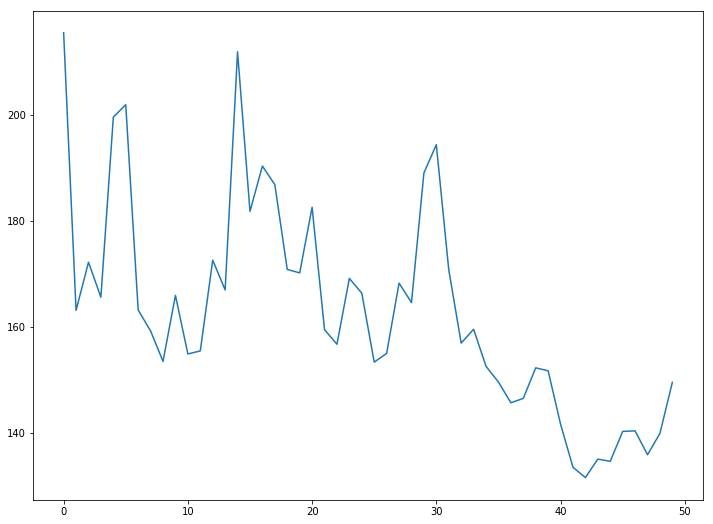

In [933]:
plt.plot(history.history['loss'])
plt.show()

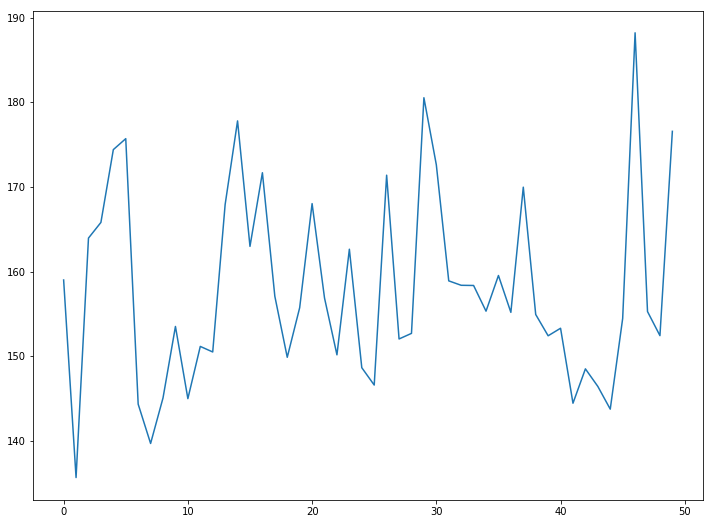

In [934]:
plt.plot(history.history['val_loss'])
plt.show()

In [935]:
comp_df = pd.DataFrame({'actual':original.flatten().tolist(),'predicted':predicted.flatten().tolist()},index=list(range(len(predicted))))
comp_df['error'] = comp_df.actual-comp_df.predicted
comp_df['ape'] = abs(comp_df.error/comp_df.actual)*100
print('MAPE = ', comp_df.ape.mean())
comp_df.head()

MAPE =  147.09785541718193


,actual,predicted,error,ape
0,55092.0,45625.0,9467.0,17.183983
1,65664.0,45625.0,20039.0,30.517483
2,62179.0,45625.0,16554.0,26.623136
3,76070.0,45625.0,30445.0,40.022348
4,71518.0,45625.0,25893.0,36.204872


In [937]:
comp_df.sort_values('ape').tail()

,actual,predicted,error,ape
2248,33250.0,5896248.0,-5862998.0,17633.076692
2288,33000.0,6164738.0,-6131738.0,18581.024242
4815,32000.0,6083221.5,-6051221.5,18910.067187
4753,32667.0,7827927.5,-7795260.5,23862.798849
4719,32500.0,7904570.0,-7872070.0,24221.753846


In [938]:
comp_df.ape.describe()

count     5616.000000
mean       147.097855
std       1130.249399
min          0.019722
25%         18.194124
50%         38.424043
75%         53.583331
max      24221.753846
Name: ape, dtype: float64

In [939]:
comp_df.ape.quantile(0.90)

58.005922022752614

### 4.3 dynamic parameterr findingg

In [120]:
from keras import losses
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
from keras.optimizers import RMSprop, Adam, SGD, Nadam


# defining search space for hyper parameter tuning
space = {
        'units1': hp.choice('units1', [8,64, 128]),
        'units2': hp.choice('units2', [8,64, 128]),
        'units3': hp.choice('units3', [8,64, 128]),
        
        'lr': hp.choice('lr',[0.01, 0.001, 0.0001]),
        'activation': hp.choice('activation',['relu',
                                                'sigmoid',
                                                'tanh',
                                                'linear']),
        'loss': hp.choice('loss', [losses.logcosh,
                                    losses.mse,
                                    losses.mae,
                                    losses.mape])
        }




/root/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:34: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.

Using TensorFlow backend.


In [121]:
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
from sklearn.metrics import roc_auc_score
import sys

def experiment(params):
    need_df = new_df[['app_rsp_time','ma5','ma20','sd5','sd20']].dropna()
    split = int(len(need_df)*.7)
    train_x = need_df.iloc[0:split,1:].values
    train_y = pd.DataFrame(need_df.iloc[0:split,0])
    test_x = need_df.iloc[split:len(need_df),1:].values
    test_y = pd.DataFrame(need_df.iloc[split:len(need_df),0])


    # normalize the dataset
    
    # Normalisijng using robust scaler
    scaler1=RobustScaler(quantile_range=(5,95))
    scaler2=RobustScaler(quantile_range=(5,95))

    scaler1 = scaler1.fit(train_x) 
    train_x = scaler1.transform(train_x)
    test_x = scaler1.transform(test_x)
    
    scaler2 = scaler2.fit(train_y) 
    train_y = scaler2.transform(train_y)
    test_y = scaler2.transform(test_y) 
    
    train_x = train_x.reshape(train_x.shape[0],1,train_x.shape[1])
    test_x = test_x.reshape(test_x.shape[0],1,test_x.shape[1])

    train_y = train_y.reshape(train_y.shape[0],1,train_y.shape[1])
    test_y = test_y.reshape(test_y.shape[0],1,test_y.shape[1])
    
    
    #define model 
    try:
        
       model_m2=Sequential()
model_m2.add(Dense(32,input_shape=(1,4)))#,
                  #batch_input_shape=(8, train_x.shape[1], train_x.shape[2]), stateful=False))
model_m2.add(Dense(12, activation= 'relu'))
#model_m2.add(Dropout(0.2))
model_m2.add(Dense(1, activation='relu'))
model_m2.summary()
    
model_m2.compile(optimizer='rmsprop',
                loss='mse')

history = model_m2.fit(train_x, train_y, epochs=50, batch_size=8,verbose=2 ,
                        validation_data=(test_x,test_y) , shuffle=False )

        model_m2.reset_states()
   
    
        # make predictions
        trainPredict = model_m2.predict(train_x,batch_size=8)
        testPredict = model_m2.predict(test_x,batch_size=8)

    except:
        print ('Something happened')
        print ('-' * 10)

        return {'loss': 999999, 'status': STATUS_OK}


    predicted = scaler2.inverse_transform(testPredict)
    original = scaler2.inverse_transform(test_y)

    mse = np.mean(np.square(predicted - original))    

    if np.isnan(mse):
        print ('NaN happened')
        print ('-' * 10)
        return {'loss': 999999, 'status': STATUS_OK}

    print(mse)
    print('-' * 10)

    sys.stdout.flush() 
    return {'loss': mse, 'status': STATUS_OK}

IndentationError: unindent does not match any outer indentation level (<tokenize>, line 59)

### 3. XGB model

In [122]:
from pandas.tseries.holiday import USFederalHolidayCalendar as calendar
import random
import xgboost as xgb

/root/anaconda3/lib/python3.6/site-packages/sklearn/cross_validation.py:41: DeprecationWarning:

This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.



In [962]:
g = [0]
g = g+list(range(18,(new_df.shape[1])))

In [963]:
    need_df = new_df.iloc[:,g].dropna()
    split = int(len(need_df)*.7)
    train_x = need_df.iloc[0:split,1:].values
    train_y = pd.DataFrame(need_df.iloc[0:split,0])
    test_x = need_df.iloc[split:len(need_df),1:].values
    test_y = pd.DataFrame(need_df.iloc[split:len(need_df),0])
    

In [964]:
need_df.head()


,app_rsp_time,hour,ma5,sd5,ma24,sd24,shift_1,shift_2,shift_3,shift_4,shift_5,shift_6,shift_7,shift_8,shift_9,shift_10,shift_11,shift_12,shift_13,shift_14,shift_15,shift_16,shift_17,shift_18,shift_19,shift_20,shift_21,shift_22,shift_23,shift_24,shift_25,shift_26,shift_27
24,41710,7,43165.75,19928.217538,50759.000000,14988.360658,30963.0,31730.0,36849.0,31187.0,50325.0,59993.0,30792.0,60043.0,59178.0,31703.0,36253.0,29773.0,30904.0,29587.0,33273.0,39212.0,83007.0,84763.0,48593.0,51281.0,82385.0,48840.0,59138.0,30243.0,83052.0,31449.0,51136.0
25,30963,9,44119.50,19681.644655,48578.736842,12882.112529,31730.0,36849.0,31187.0,50325.0,59993.0,30792.0,60043.0,59178.0,31703.0,36253.0,29773.0,30904.0,29587.0,33273.0,39212.0,83007.0,84763.0,48593.0,51281.0,82385.0,48840.0,59138.0,30243.0,83052.0,31449.0,51136.0,73309.0
26,31730,12,36336.50,7599.276577,47720.176471,14080.366052,36849.0,31187.0,50325.0,59993.0,30792.0,60043.0,59178.0,31703.0,36253.0,29773.0,30904.0,29587.0,33273.0,39212.0,83007.0,84763.0,48593.0,51281.0,82385.0,48840.0,59138.0,30243.0,83052.0,31449.0,51136.0,73309.0,30953.0
27,36849,14,31346.50,542.350901,44922.750000,13592.794133,31187.0,50325.0,59993.0,30792.0,60043.0,59178.0,31703.0,36253.0,29773.0,30904.0,29587.0,33273.0,39212.0,83007.0,84763.0,48593.0,51281.0,82385.0,48840.0,59138.0,30243.0,83052.0,31449.0,51136.0,73309.0,30953.0,34607.0
28,31187,16,34289.50,3619.679613,45298.000000,13256.973456,50325.0,59993.0,30792.0,60043.0,59178.0,31703.0,36253.0,29773.0,30904.0,29587.0,33273.0,39212.0,83007.0,84763.0,48593.0,51281.0,82385.0,48840.0,59138.0,30243.0,83052.0,31449.0,51136.0,73309.0,30953.0,34607.0,89067.0


In [965]:
    xg_train_1 = xgb.DMatrix(train_x, label=train_y)
    xg_test = xgb.DMatrix(test_x, label=test_y)
    
    s_time = datetime.datetime.now()

    params = {'objective': 'reg:linear', 'verbose': True , 'eval' : 'rmse ' ,'gamma':.01,
             'max_depth':3, 'min_child_weight':3,'eta':.02,'num_round':350}
    #params = {  'objective':'reg:linear' , 'verbose': True , 'eval' : 'rmse ' }
    model_1_mean5 = xgb.train(params, xg_train_1, 200)
    e_time = datetime.datetime.now()
    run_time = (e_time - s_time)
    print((run_time.seconds)/60,"minuts")

AttributeError: module 'xgboost' has no attribute 'DMatrix'

In [975]:
import xgboost

In [976]:
xgboost.DMatrix

AttributeError: module 'xgboost' has no attribute 'DMatrix'

In [1201]:
z1.app_rsp_time.quantile(.60)

122391.4

## 4. prophet model


In [21]:
from fbprophet import Prophet
from sklearn.metrics import mean_squared_error as mse
import math
#z1.index = z1.date
def create_prophet_m(app_name,z1):
    
    ### --- For realtime pred ---###
    
    full_df = z1.app_rsp_time.iloc[0:len(z1)]
    full_df = full_df.reset_index()
    full_df.columns = ['ds','y']
    
    #-- Realtime prediction --##
    #model 
    model_r = Prophet(yearly_seasonality=False,changepoint_prior_scale=.2)
    model_r.fit(full_df)
    future_r = model_r.make_future_dataframe(periods=24,freq='H')
    forecast_r = model_r.predict(future_r)
    forecast_r.index = forecast_r['ds']
    #forecast 
    pred_r = pd.DataFrame(forecast_r['yhat'][len(z1):(len(z1)+24)])
    pred_r=pred_r.reset_index()
    #--- completes realtime pred ---#
    
    train_end_index=len(z1.app_rsp_time)-24
    train_df=z1.app_rsp_time.iloc[0:train_end_index]
    #train_df= train_df[train_df<cutter]
    
    
    test_df=z1.app_rsp_time.iloc[train_end_index:len(z1)]
    
    
    
    train_df=train_df.reset_index()
    test_df=test_df.reset_index()
    train_df.columns=['ds','y']
    
    #--- removing outliers in trainset  ---#
    
    q50 = train_df.y.median()
    q100 = train_df.y.quantile(1)
    q75  = train_df.y.quantile(.75)
    print(max(train_df.y))
    if((q100-q50) >= (2*q50)):
        print('ind')
        train_df.loc[train_df.y>=(2*q50),'y'] = None
        
        print(max(train_df.y))
        print((q100-q50),(1.5*q50))
    
    
    test_df.columns=['ds','y']
    #print(train_df.tail())
    #print(test_df.head())
    
    #model 
    model = Prophet(yearly_seasonality=False,changepoint_prior_scale=.2)
    model.fit(train_df)
    future = model.make_future_dataframe(periods=len(test_df),freq='H')
    forecast = model.predict(future)
    forecast.index = forecast['ds']
    #forecast 
    pred = pd.DataFrame(forecast['yhat'][train_end_index:len(z1)])
    pred=pred.reset_index()
    pred_df=pd.merge(test_df,pred,on='ds',how='left')
    pred_df.dropna(inplace=True)
    
    df=pd.DataFrame()
    
    if(len(pred_df)>0):
        
        pred_df['error_test']=pred_df.y-pred_df.yhat
    
        t_mean =train_df.y.mean()
        pred_df['train_mean']=t_mean
        pred_df['mean_diff']= abs(pred_df.train_mean-pred_df.y)
    
        mean_mse=mse(pred_df.y,pred_df.train_mean)
        mean_RMSE=math.sqrt(mean_mse)
        pred_df['mean_APE']=abs(pred_df.mean_diff*100/pred_df.y)
        mean_MAPE=pred_df.mean_APE.mean()
    
        MSE=mse(pred_df.y,pred_df.yhat)
        RMSE=math.sqrt(MSE)
        pred_df['APE']=abs(pred_df.error_test*100/pred_df.y)
        MAPE=pred_df.APE.mean()
        print("App name:",app_name)
        print("MSE  :",MSE)
        print("RMSE :",RMSE)
        print("MAPE :",MAPE)
        #print("RMSE from mean :",mean_RMSE)
        #print("MAPE from mean :",mean_MAPE)
    
        print(pred_df.head())
        q98=pred_df['APE'].quantile(0.98)
        mape_q98=pred_df['APE'][pred_df.APE<pred_df['APE'].quantile(0.98)].mean()

        df = pd.DataFrame({'length':len(z1),#'predicted_t':[forcast_lag],
                             'test_rmse':RMSE,
                             'test_mape':MAPE,
                 #'test_ape_98':q98,
                 'test_mape_98':mape_q98},
                      #'rmse_by_mean':mean_RMSE,
                      #'mape_by_mean':mean_MAPE}
                          index=[app_name])

    return(df,model,forecast,pred_df,pred_r)

134.141.5.104	134.141.36.60/

In [22]:
tt = appid_datapoint_alld_skype[(appid_datapoint_alld_skype.source=='134.141.5.104') & (appid_datapoint_alld_skype.target_address=='134.141.36.60/')]
    
ew_prophet,ew_model,ew_forcast,ew_pred_df,pred_r=(create_prophet_m('skype',tt))

NameError: name 'appid_datapoint_alld_skype' is not defined

In [1391]:
    tt = prophet_df[(prophet_df.source=='134.141.5.104') & (prophet_df.target=='134.141.36.60/')]
    tools = 'pan,wheel_zoom,xbox_select,reset'
    
    
    output_notebook()
    p=figure(title='smoothed',plot_height = 600 ,plot_width =800,tools=[tools])
    
    p.circle('ds','y',source=tt,color='green')
    p.line('ds','y',source=tt,color='orange')
    p.line('ds','yhat',source=tt,color='blue')
    p.circle('ds','yhat',source=tt,color='blue')
    show(p)

Loading BokehJS ...

In [1361]:
ew_prophet,ew_model,ew_forcast,ew_pred_df=(create_prophet_m('skype',z1))
ew_prophet

App name: skype
MSE  : 137050801.6067061
RMSE : 11706.869846662947
MAPE : 9.814057029288184
                   ds      y          yhat    error_test     train_mean  \
0 2018-02-08 15:00:00  80760  95936.448607 -15176.448607  116677.212742   
1 2018-02-08 16:00:00  91219  96904.733264  -5685.733264  116677.212742   
2 2018-02-08 17:00:00  73477  97753.651702 -24276.651702  116677.212742   
3 2018-02-08 18:00:00  92158  97274.679503  -5116.679503  116677.212742   
4 2018-02-08 19:00:00  82717  95601.893324 -12884.893324  116677.212742   

      mean_diff   mean_APE        APE  
0  35917.212742  44.474013  18.792036  
1  25458.212742  27.908893   6.233058  
2  43200.212742  58.794198  33.039797  
3  24519.212742  26.605626   5.552073  
4  33960.212742  41.055905  15.577080  


,length,test_ape_98,test_mape,test_mape_98,test_rmse
skype,1782,27.939761,9.814057,8.804242,11706.869847


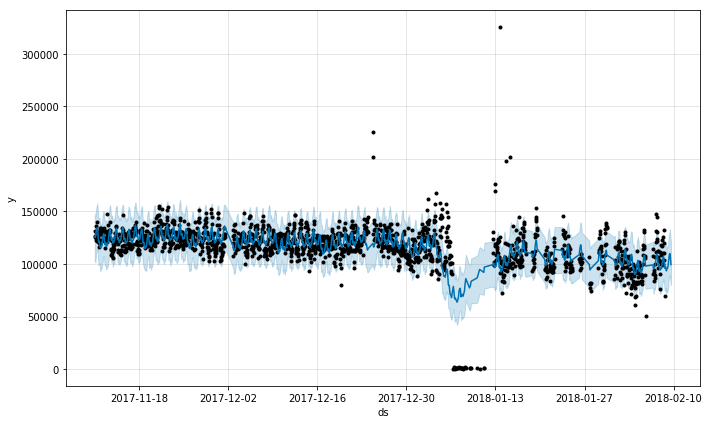

In [1362]:
ew_model.plot(ew_forcast)

In [1162]:
ew_pred_df.tail()

,ds,y,yhat,error_test,train_mean,mean_diff,mean_APE,APE
19,2018-02-09 10:00:00,110282,109957.676731,324.323269,116677.212742,6395.212742,5.798963,0.294085
20,2018-02-09 11:00:00,122971,108594.141002,14376.858998,116677.212742,6293.787258,5.118107,11.691260
21,2018-02-09 12:00:00,135242,105552.646690,29689.353310,116677.212742,18564.787258,13.727087,21.952761
22,2018-02-09 13:00:00,98424,101944.349887,-3520.349887,116677.212742,18253.212742,18.545490,3.576719
23,2018-02-09 14:00:00,88588,99412.881222,-10824.881222,116677.212742,28089.212742,31.707695,12.219354


In [131]:
    hover =HoverTool(
    tooltips=[
        ( 'date',   '@date{%F}'            ),
        ( 'real',  '@{app_rsp_time}{%0.2f}' ), # use @{ } for field names with spaces
        ( 'smoothed',  '@{smooth}{%0.2f}' ),
        ( 'delta',  '@{delta}{%0.2f}' ),
        
        
        #( 'volume', '@volume{0.00 a}'      ),
    ],

    formatters={
        'date'      : 'datetime', # use 'datetime' formatter for 'date' field
        'app_rsp_time' : 'printf',
        'smooth' : 'printf',
        'delta' : 'printf',
        
        # use 'printf' formatter for 'adj close' field
                                  # use default 'numeral' formatter for other fields
    },

    # display a tooltip whenever the cursor is vertically in line with a glyph
    mode='vline'
)
    
    tools = 'pan,wheel_zoom,xbox_select,reset'
    
    label1=z1.date
        
    output_notebook()
    p=figure(title='smoothed',plot_height = 600 ,plot_width =800,tools=[tools])
    
    p.circle('ds','y',source=ew_pred_df,color='green')
    p.line('ds','y',source=ew_pred_df,color='orange')
    p.line('ds','yhat',source=ew_pred_df,color='blue')
    p.circle('ds','yhat',source=ew_pred_df,color='blue')
    show(p)
    

AttributeError: 'DataFrame' object has no attribute 'date'

In [132]:
z1.head()

,app_rsp_time,application,applicationgroup,byte_count,flow_count,rx_byte_count,rx_flow_count,source,target_address,target_attribute_id,tcp_rsp_time,time_stamp,tx_byte_count,tx_flow_count,user_data,zone
381929,129521,Skype for Business,Real Time and Cloud Communications,6509663,4342,3603115,2240,134.141.5.104,10.120.89.113/,217832300,127177,1511647200000,2906548,2102,NaN,NaN
382289,128127,Skype for Business,Real Time and Cloud Communications,9311033,3838,3922498,1908,10.6.1.101,10.120.89.113/,217836795,126229,1511647200000,5388535,1930,NaN,NaN
382627,77316,Skype for Business,Real Time and Cloud Communications,181022,48,90910,26,134.141.115.101,10.120.89.113/,217839051,73180,1511647200000,90112,22,NaN,NaN
382741,1630,Skype for Business,Real Time and Cloud Communications,557053,704,241585,354,134.141.208.230,10.120.89.113/,217839899,315,1511647200000,315468,350,NaN,NaN


In [1165]:
s_list

array(['10.6.1.101', '134.141.208.230', '134.141.115.101',
       '134.141.5.104', '134.141.121.91', '134.141.5.102',
       '134.141.224.29'], dtype=object)

In [1166]:
conn.close()
conn = connect_to_mysql()
with conn.cursor() as cursor:
        # Read a  record
        sql = " select * from appid_datapoint where  application in ( 'Skype for Business' ) and app_rsp_time>0 and target_address in ( '10.120.89.113/' ) and source='134.141.5.104' "
        cursor.execute(sql) 
        appid_datapoint_alld_1t_1s_skype = pd.DataFrame(cursor.fetchall())
appid_datapoint_alld_1t_1s_skype.shape

(1782, 16)

In [1167]:
z1.shape

(1782, 20)

In [1168]:
print(min(z1.date),max(z1.date))

2017-11-11 00:00:00 2018-02-09 14:00:00


In [1169]:
dates = appid_datapoint_alld_1t_1s_skype.time_stamp.astype(int)
dates_outlook =pd.to_datetime(pd.Series(dates),unit='ms')
print(min(dates_outlook),max(dates_outlook))

2017-11-11 00:00:00 2018-02-09 14:00:00


### 4.1 for seperate sources and targets

In [133]:
s_list = appid_datapoint_10days.source.unique()
len(s_list)

7

In [134]:
len(t_list)

200

In [1087]:
temp2.head()


,app_rsp_time,application,applicationgroup,byte_count,flow_count,rx_byte_count,rx_flow_count,source,target_address,target_attribute_id,tcp_rsp_time,time_stamp,tx_byte_count,tx_flow_count,user_data,zone
time_stamp,,,,,,,,,,,,,,,,
2017-11-11 00:00:00,248654,Skype for Business,Real Time and Cloud Communications,110610,16,30282,8,134.141.208.230,10.6.16.182/,214751813,237519,1510358400000,80328,8,None,None
2017-11-11 01:00:00,248569,Skype for Business,Real Time and Cloud Communications,108455,18,29832,10,134.141.208.230,10.6.16.182/,214757109,237388,1510362000000,78623,8,None,None
2017-11-13 11:00:00,254677,Skype for Business,Real Time and Cloud Communications,189531,32,69350,17,134.141.208.230,10.6.16.182/,215239281,237672,1510570800000,120181,15,None,None
2017-11-13 12:00:00,246328,Skype for Business,Real Time and Cloud Communications,283058,43,92159,22,134.141.208.230,10.6.16.182/,215248373,234889,1510574400000,190899,21,None,None
2017-11-13 13:00:00,245949,Skype for Business,Real Time and Cloud Communications,320956,49,101863,24,134.141.208.230,10.6.16.182/,215257829,237449,1510578000000,219093,25,None,None


In [1088]:
temp2.shape

(513, 16)

In [24]:
appid_datapoint_alld_skype = appid_datapoint_10days[appid_datapoint_10days.application=='Skype for Business']
dates = appid_datapoint_alld_skype.time_stamp.astype(int)
dates_outlook =pd.to_datetime(pd.Series(dates),unit='ms')
appid_datapoint_alld_skype.index = dates_outlook
appid_datapoint_alld_skype.shape

(1343380, 16)

In [26]:
from tqdm import tqdm
prophet_df = pd.DataFrame()
prophet_analysis_df = pd.DataFrame()
prophet_future_df = pd.DataFrame()
temp_p = appid_datapoint_10days.copy()
t_list = appid_datapoint_10days.target_address.value_counts().index[0:100]
a_list = ['Skype for Business']
for a in tqdm(a_list):
    temp = temp_p[temp_p.application==a]
    for i in tqdm(range(0,100)):
        t = t_list[i]
        temp1 = temp[temp.target_address==t]
        for s in s_list:
            temp2 = temp1[temp1.source==s]
            if(len(temp2)<=1400):
                continue
            ew_prophet,ew_model,ew_forcast,ew_pred_df,pred_r =(create_prophet_m('skype',temp2))
            ew_pred_df['application'] = a
            ew_pred_df['target'] = t
            ew_pred_df['source'] = s
            
            pred_r['application'] = a
            pred_r['target'] = t
            pred_r['source'] = s
            #ew_pred_df['attribute_id'] = temp2.iloc[(len(temp2)-len(ew_pred_df)):len(temp2),'target_attribute_id']
        
            aid = temp2.target_attribute_id.unique()
        
            conn.close()
            conn = connect_to_mysql()
            with conn.cursor() as cursor:
                # Read a  record
                sql = " select * from appid_attribute where  target_address in ( '"+t+"' ) and source='"+s+"' "
                cursor.execute(sql) 
                tt_attr = pd.DataFrame(cursor.fetchall())
            
        
            #tt_attr = appid_attribute[(appid_attribute.source==s) & (appid_attribute.target_address==t)]

            vc = tt_attr[tt_attr.attribute_id.isin(aid)].target_type.value_counts()
            ew_prophet['target'] = t
            ew_prophet['source'] = s
            ew_prophet['application'] = a
            vc_i = vc.index
            ew_prophet['SERVER_COUNT'] = None
            ew_prophet['CLIENT_COUNT'] = None
            print(max(temp2.time_stamp.value_counts()))
        
        
            for k in vc_i:
                k1 =k+'_COUNT'
                ew_prophet[k1]=vc[k]
        
        
            prophet_df = prophet_df.append(ew_pred_df)  
            prophet_analysis_df = prophet_analysis_df.append(ew_prophet)
        
    

  0%|          | 0/100 [00:00<?, ?it/s]



NameError: name 't_list' is not defined

In [137]:
prophet_analysis_df

,length,test_ape_98,test_mape,test_mape_98,test_rmse,target,source,SERVER_COUNT,CLIENT_COUNT
skype,1856,10.733500,3.489334,3.050756,6014.380321,10.120.89.113/,10.6.1.101,549,1304
skype,1782,27.939761,9.814057,8.804242,11706.869847,10.120.89.113/,134.141.5.104,1159,623
skype,1874,19.623282,10.091915,9.555282,5781.858227,10.6.16.182/,10.6.1.101,1659,212
skype,1930,47.444805,15.483852,13.673086,4386.172799,10.6.16.182/,134.141.5.104,262,1668
skype,1874,24.272362,11.106248,10.522577,6657.838979,10.6.16.183/,10.6.1.101,1685,186
skype,1930,49.866757,15.605394,14.023428,3104.295568,10.6.16.183/,134.141.5.104,674,1256
skype,1874,57.261330,16.862743,14.851825,8371.731574,10.6.16.181/,10.6.1.101,1634,237
skype,1930,135.178630,24.524623,16.826404,5772.848778,10.6.16.181/,134.141.5.104,468,1462
skype,1874,32.382122,16.087632,15.331466,46.883000,10.6.31.25/,10.6.1.101,1871,None
skype,1856,21.687021,6.385420,5.679551,9217.614123,10.120.89.114/,10.6.1.101,365,1488


In [23]:
prophet_analysis_df = (prophet_analysis_df[prophet_analysis_df.source!='134.141.5.104'].sort_values(by='test_mape'))
prophet_analysis_df.to_csv('app_rsp_time_analysis_data.csv',index=False)
prophet_df.to_csv('app_rsp_time_evaluation_data.csv',index=False)
prophet_future_df.to_csv('app_rsp_time_forecast_data.csv',index=False)

NameError: name 'prophet_analysis_df' is not defined

In [138]:
prophet_analysis_df[['test_mape','test_mape_98','source','target','SERVER_COUNT','CLIENT_COUNT']].sort_values(by='test_mape')

,test_mape,test_mape_98,source,target,SERVER_COUNT,CLIENT_COUNT
skype,0.665668,0.583528,10.6.1.101,134.141.38.140/,1861,10
skype,0.974219,0.880896,10.6.1.101,134.141.38.141/,1867,4
skype,1.242329,1.108087,10.6.1.101,134.141.208.19/,1830,22
skype,1.650877,1.208975,10.6.1.101,134.141.208.18/,1830,22
skype,3.489334,3.050756,10.6.1.101,10.120.89.113/,549,1304
skype,4.301675,4.021256,134.141.5.104,10.6.17.63/,15,1492
skype,5.407873,4.839434,10.6.1.101,134.141.77.75/usnh-lyncfe-p1,1841,None
skype,6.142832,5.780041,10.6.1.101,134.141.43.236/,1578,8
skype,6.385420,5.679551,10.6.1.101,10.120.89.114/,365,1488
skype,7.296774,5.509888,10.6.1.101,134.141.77.76/usnh-lyncfe-p2,1840,1


In [139]:
prophet_analysis_df[prophet_analysis_df.source!='134.141.5.104'].sort_values(by='test_mape')

,length,test_ape_98,test_mape,test_mape_98,test_rmse,target,source,SERVER_COUNT,CLIENT_COUNT
skype,1874,2.275298,0.665668,0.583528,630.895082,134.141.38.140/,10.6.1.101,1861,10
skype,1874,3.001373,0.974219,0.880896,862.568885,134.141.38.141/,10.6.1.101,1867,4
skype,1855,3.396806,1.242329,1.108087,3633.920508,134.141.208.19/,10.6.1.101,1830,22
skype,1855,8.221763,1.650877,1.208975,7331.414037,134.141.208.18/,10.6.1.101,1830,22
skype,1856,10.733500,3.489334,3.050756,6014.380321,10.120.89.113/,10.6.1.101,549,1304
skype,1844,16.805687,5.407873,4.839434,1595.624645,134.141.77.75/usnh-lyncfe-p1,10.6.1.101,1841,None
skype,1589,13.932402,6.142832,5.780041,6060.881052,134.141.43.236/,10.6.1.101,1578,8
skype,1856,21.687021,6.385420,5.679551,9217.614123,10.120.89.114/,10.6.1.101,365,1488
skype,1844,32.219146,7.296774,5.509888,4594.355829,134.141.77.76/usnh-lyncfe-p2,10.6.1.101,1840,1
skype,1844,42.925682,7.306405,4.751195,9354.433808,134.141.77.77/usnh-lyncfe-p3,10.6.1.101,1841,None


In [140]:
len(prophet_analysis_df)

52

In [141]:
len(prophet_analysis_df[prophet_analysis_df.test_mape<=20])

31

In [142]:
prophet_analysis_df.describe()

,length,test_ape_98,test_mape,test_mape_98,test_rmse
count,52.000000,52.000000,52.000000,52.000000,52.000000
mean,1802.711538,171.511940,65.289450,59.464362,22233.313813
std,123.070574,556.960537,198.425665,180.017233,67232.010758
min,1449.000000,2.275298,0.665668,0.583528,24.300350
25%,1793.750000,27.704474,10.468542,9.367522,2090.822597
50%,1858.000000,54.033034,16.483346,14.974193,6037.630687
75%,1874.000000,93.376830,43.816954,35.766681,16923.080605
max,1930.000000,3613.921599,1053.220153,980.692592,475688.598767


In [1398]:
prophet_analysis_df = (prophet_analysis_df[prophet_analysis_df.source!='134.141.5.104'].sort_values(by='test_mape'))

34

In [1174]:
prophet_df.tail()

,ds,y,yhat,error_test,train_mean,mean_diff,mean_APE,APE,application,target,source
19,2018-02-09 14:00:00,7327,13173.964314,-5846.964314,12272.067769,4945.067769,67.491030,79.800250,Skype for Business,10.6.112.46/,10.6.1.101
20,2018-02-09 15:00:00,13209,13201.671386,7.328614,12272.067769,936.932231,7.093135,0.055482,Skype for Business,10.6.112.46/,10.6.1.101
21,2018-02-09 16:00:00,16512,13119.509746,3392.490254,12272.067769,4239.932231,25.677884,20.545605,Skype for Business,10.6.112.46/,10.6.1.101
22,2018-02-09 17:00:00,20891,12951.159086,7939.840914,12272.067769,8618.932231,41.256676,38.006036,Skype for Business,10.6.112.46/,10.6.1.101
23,2018-02-09 18:00:00,15706,12935.891923,2770.108077,12272.067769,3433.932231,21.863824,17.637260,Skype for Business,10.6.112.46/,10.6.1.101


In [1175]:
tt = prophet_df[(prophet_df.source=='134.141.5.104') & (prophet_df.target=='134.141.124.11/')]

In [1176]:
    tools = 'pan,wheel_zoom,xbox_select,reset'
    
    
    output_notebook()
    p=figure(title='smoothed',plot_height = 600 ,plot_width =800,tools=[tools])
    
    p.circle('ds','y',source=tt,color='green')
    p.line('ds','y',source=tt,color='orange')
    p.line('ds','yhat',source=tt,color='blue')
    p.circle('ds','yhat',source=tt,color='blue')
    show(p)

Loading BokehJS ...

In [1177]:
tt = prophet_df[ (prophet_df.target=='10.120.89.113/')]
tt

,ds,y,yhat,error_test,train_mean,mean_diff,mean_APE,APE,application,target,source
0,2018-02-08 19:00:00,113223,128440.098908,-15217.098908,137573.541485,24350.541485,21.506709,13.439936,Skype for Business,10.120.89.113/,10.6.1.101
1,2018-02-08 20:00:00,119138,127015.398172,-7877.398172,137573.541485,18435.541485,15.474107,6.611995,Skype for Business,10.120.89.113/,10.6.1.101
2,2018-02-08 21:00:00,124957,128119.060302,-3162.060302,137573.541485,12616.541485,10.096706,2.530519,Skype for Business,10.120.89.113/,10.6.1.101
3,2018-02-08 22:00:00,129846,129574.305132,271.694868,137573.541485,7727.541485,5.951313,0.209244,Skype for Business,10.120.89.113/,10.6.1.101
4,2018-02-08 23:00:00,129790,129297.118444,492.881556,137573.541485,7783.541485,5.997027,0.379753,Skype for Business,10.120.89.113/,10.6.1.101
5,2018-02-09 00:00:00,131894,127543.144954,4350.855046,137573.541485,5679.541485,4.306141,3.298751,Skype for Business,10.120.89.113/,10.6.1.101
6,2018-02-09 01:00:00,120134,126863.807144,-6729.807144,137573.541485,17439.541485,14.516741,5.601917,Skype for Business,10.120.89.113/,10.6.1.101
7,2018-02-09 02:00:00,133930,129698.433229,4231.566771,137573.541485,3643.541485,2.720482,3.159536,Skype for Business,10.120.89.113/,10.6.1.101
8,2018-02-09 03:00:00,136604,135872.526188,731.473812,137573.541485,969.541485,0.709746,0.535470,Skype for Business,10.120.89.113/,10.6.1.101
9,2018-02-09 04:00:00,140678,142433.036111,-1755.036111,137573.541485,3104.458515,2.206783,1.247555,Skype for Business,10.120.89.113/,10.6.1.101


In [1178]:
tt = prophet_analysis_df[ (prophet_analysis_df.target=='10.120.89.113/')]
tt

,length,test_ape_98,test_mape,test_mape_98,test_rmse,target,source
skype,1856,10.941272,3.731738,3.309642,6285.591515,10.120.89.113/,10.6.1.101
skype,1782,27.939761,9.814057,8.804242,11706.869847,10.120.89.113/,134.141.5.104


In [1179]:
prophet_analysis_df[prophet_analysis_df.test_mape>=20]

,length,test_ape_98,test_mape,test_mape_98,test_rmse,target,source
skype,1930,132.513813,24.041333,16.561509,5788.799729,10.6.16.181/,134.141.5.104
skype,1874,238.919254,115.490630,109.813799,268.792568,10.6.31.25/,10.6.1.101
skype,1449,20282.361036,3837.259525,2950.308114,143839.367314,10.120.89.114/,134.141.208.230
skype,1868,80.295086,42.856837,41.168851,1456.542765,134.141.97.151/hu10061002074.global.avaya.com,10.6.1.101
skype,1903,156.069691,62.629437,58.202368,716.212862,134.141.97.151/hu10061002074.global.avaya.com,134.141.5.104
skype,1874,51.256497,28.302447,27.203613,18713.066717,134.141.36.60/,10.6.1.101
skype,1726,3575.192381,1007.143688,883.726862,32996.099143,134.141.36.60/,134.141.5.104
skype,1601,311.256058,170.548753,164.353004,3257.173162,10.6.16.140/,134.141.5.104
skype,1862,62.828210,42.619008,41.653421,8805.669758,134.141.124.11/,134.141.5.104
skype,1810,197.809617,44.305821,34.717788,40970.105921,134.141.192.200/,10.6.1.101


In [1180]:
prophet_analysis_df.groupby('source').describe()

length                                                   \
                 count         mean         std     min     25%     50%   
source                                                                    
10.6.1.101        30.0  1828.666667   97.780307  1457.0  1844.0  1861.0   
134.141.208.230    1.0  1449.000000         NaN  1449.0  1449.0  1449.0   
134.141.5.102      3.0  1628.000000    3.464102  1626.0  1626.0  1626.0   
134.141.5.104     18.0  1808.222222  123.128606  1507.0  1782.5  1862.0   

                                 test_ape_98                             \
                     75%     max       count          mean          std   
source                                                                    
10.6.1.101       1874.00  1874.0        30.0    131.308288   258.058824   
134.141.208.230  1449.00  1449.0         1.0  20282.361036          NaN   
134.141.5.102    1629.00  1632.0         3.0     71.341269    29.307581   
134.141.5.104    1881.75  1930.0        18.0    583.403273  1506.189156   

                                                                         \
                          min           25%           50%           75%   
source                                                                    
10.6.1.101           2.275298     19.953251     56.772811    139.748275   
134.141.208.230  20282.361036  20282.361036  20282.361036  20282.361036   
134.141.5.102       42.650828     56.397264     70.143701     85.686489   
134.141.5.104       16.588534     34.918917     58.411365    130.262168   

                              test_mape                                        \
                          max     count         mean         std          min   
source                                                                          
10.6.1.101        1395.268614      30.0    40.418409   66.462132     0.665668   
134.141.208.230  20282.361036       1.0  3837.259525         NaN  3837.259525   
134.141.5.102      101.229277       3.0    16.700518    3.429194    13.980442   
134.141.5.104     5632.310240      18.0   257.241141  746.365693     8.743302   

                                                                     \
                         25%          50%          75%          max   
source                                                                
10.6.1.101          6.801458    17.959231    43.943575   330.446253   
134.141.208.230  3837.259525  3837.259525  3837.259525  3837.259525   
134.141.5.102      14.774479    15.568517    18.060556    20.552596   
134.141.5.104      14.703110    22.293163    41.462095  3099.385629   

                test_mape_98                                        \
                       count         mean         std          min   
source                                                               
10.6.1.101              30.0    35.816583   57.812512     0.583528   
134.141.208.230          1.0  2950.308114         NaN  2950.308114   
134.141.5.102            3.0    13.986319    2.401582    12.298646   
134.141.5.104           18.0   237.513619  697.208745     8.373149   

                                                                    test_rmse  \
                         25%          50%          75%          max     count   
source                                                                          
10.6.1.101          5.577426    15.233812    39.553007   279.221835      30.0   
134.141.208.230  2950.308114  2950.308114  2950.308114  2950.308114       1.0   
134.141.5.102      12.611588    12.924529    14.830156    16.735783       3.0   
134.141.5.104      13.604805    17.812466    39.828267  2908.876353      18.0   

                                                                            \
                          mean           std            min            25%   
source                                                                       
10.6.1.101        24204.495723  86092.087099     268.792568    1961.447829   
1

In [1181]:
prophet_analysis_df[(prophet_analysis_df.source=='134.141.208.230') ]

,length,test_ape_98,test_mape,test_mape_98,test_rmse,target,source
skype,1449,20282.361036,3837.259525,2950.308114,143839.367314,10.120.89.114/,134.141.208.230


In [1182]:
appid_datapoint_alld_skype[(appid_datapoint_alld_skype.source=='134.141.208.230') &  (appid_datapoint_alld_skype.target_address=='10.120.89.113/')].shape                                   

(1346, 16)

In [1183]:
tt = appid_datapoint_alld_skype[appid_datapoint_alld_skype.target_address.isin(t_list[0:100])]

In [1184]:
tt[tt.source=='134.141.208.230'].target_address.value_counts()

10.120.89.114/                  1449
10.120.89.113/                  1346
10.6.31.25/                     1151
134.141.77.27/                  1108
134.141.77.26/                   994
134.141.208.18/                  943
134.141.208.19/                  938
10.6.16.182/                     513
10.6.16.183/                     512
10.6.16.181/                     441
134.141.77.76/usnh-lyncfe-p2      13
134.141.77.77/usnh-lyncfe-p3      12
134.141.77.75/usnh-lyncfe-p1      10
134.141.157.11/                    2
10.6.99.169/                       1
10.6.99.174/                       1
134.141.192.200/                   1
Name: target_address, dtype: int64

In [1185]:
prophet_analysis_df[prophet_analysis_df.source=='134.141.208.230']

,length,test_ape_98,test_mape,test_mape_98,test_rmse,target,source
skype,1449,20282.361036,3837.259525,2950.308114,143839.367314,10.120.89.114/,134.141.208.230


In [1186]:
prophet_analysis_df[prophet_analysis_df.source=='10.6.1.101']

,length,test_ape_98,test_mape,test_mape_98,test_rmse,target,source
skype,1856,10.941272,3.731738,3.309642,6285.591515,10.120.89.113/,10.6.1.101
skype,1874,19.623282,10.091915,9.555282,5781.858227,10.6.16.182/,10.6.1.101
skype,1874,24.272362,11.106248,10.522577,6657.838979,10.6.16.183/,10.6.1.101
skype,1874,57.261330,16.862743,14.851825,8371.731574,10.6.16.181/,10.6.1.101
skype,1874,238.919254,115.490630,109.813799,268.792568,10.6.31.25/,10.6.1.101
skype,1856,20.943160,6.638753,6.008016,9518.987740,10.120.89.114/,10.6.1.101
skype,1868,80.295086,42.856837,41.168851,1456.542765,134.141.97.151/hu10061002074.global.avaya.com,10.6.1.101
skype,1874,51.256497,28.302447,27.203613,18713.066717,134.141.36.60/,10.6.1.101
skype,1870,30.518783,13.686483,12.934447,5163.816670,10.6.16.140/,10.6.1.101
skype,1872,94.093393,19.055720,15.615799,476972.907738,134.141.124.11/,10.6.1.101


In [143]:
t='10.6.31.27/'
s='10.6.1.101'
tt = appid_datapoint_alld_skype[(appid_datapoint_alld_skype.source==s) & (appid_datapoint_alld_skype.target_address==t)]

with conn.cursor() as cursor:
            # Read a  record
            sql = " select * from appid_attribute where  target_address in ( '"+t+"' ) and source='"+s+"' "
            cursor.execute(sql) 
            tt_attr = pd.DataFrame(cursor.fetchall())

tt_attr['target_attribute_id']=tt_attr['attribute_id']
tt1 = pd.merge(tt,tt_attr,on='target_attribute_id',how='left')

tools = 'pan,wheel_zoom,xbox_select,reset'
    
    
output_notebook()
p=figure(title='smoothed',plot_height = 600 ,plot_width =800,tools=[tools])
    
p.circle('time_stamp_x','app_rsp_time',source=tt1[tt1.target_type=='SERVER'],color='green')
p.circle('time_stamp_x','app_rsp_time',source=tt1[tt1.target_type=='CLIENT'],color='red')
#p.line('time_stamp','app_rsp_time',source=tt1,color='orange')

show(p)

Loading BokehJS ...

In [1350]:
tt_out = tt1[tt1.app_rsp_time>4000]
tt_in = tt1[tt1.app_rsp_time<4000]


In [1351]:
tt_out

,app_rsp_time,application,applicationgroup,byte_count,flow_count,rx_byte_count,rx_flow_count,source_x,target_address_x,target_attribute_id,tcp_rsp_time,time_stamp_x,tx_byte_count,tx_flow_count,user_data,zone,attribute_id,detailed_location,device_type,location,profile,source_y,target_address_y,target_type,time_stamp_y,user_data1,user_data2,username
103,51195,Skype for Business,Real Time and Cloud Communications,59236,199,34737,52,10.6.1.101,10.6.31.27/,215690812,41,1510729200000,24499,147,None,None,215690812.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.510729e+12,None,None,None
107,81816,Skype for Business,Real Time and Cloud Communications,46150,148,27543,41,10.6.1.101,10.6.31.27/,215732559,34,1510743600000,18607,107,None,None,215732559.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.510744e+12,None,None,None
108,68637,Skype for Business,Real Time and Cloud Communications,58697,188,36063,55,10.6.1.101,10.6.31.27/,215735283,38,1510747200000,22634,133,None,None,215735283.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.510747e+12,None,None,None
145,4529,Skype for Business,Real Time and Cloud Communications,82678,263,50406,71,10.6.1.101,10.6.31.27/,217033145,36,1511359200000,32272,192,None,None,217033145.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.511359e+12,None,None,None
181,51722,Skype for Business,Real Time and Cloud Communications,81215,256,48421,73,10.6.1.101,10.6.31.27/,217410421,43,1511488800000,32794,183,None,None,217410421.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.511489e+12,None,None,None
265,32974,Skype for Business,Real Time and Cloud Communications,91483,303,54365,82,10.6.1.101,10.6.31.27/,218204456,41,1511791200000,37118,221,None,None,218204456.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.511791e+12,None,None,None
304,38830,Skype for Business,Real Time and Cloud Communications,69525,229,43367,65,10.6.1.101,10.6.31.27/,218677436,44,1511931600000,26158,164,None,None,218677436.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.511932e+12,None,None,None
423,66841,Skype for Business,Real Time and Cloud Communications,50438,168,31284,46,10.6.1.101,10.6.31.27/,219835626,76,1512381600000,19154,122,None,None,219835626.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.512382e+12,None,None,None
465,19440,Skype for Business,Real Time and Cloud Communications,95651,316,58972,88,10.6.1.101,10.6.31.27/,220396860,39,1512532800000,36679,228,None,None,220396860.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.512533e+12,None,None,None
558,42580,Skype for Business,Real Time and Cloud Communications,85719,273,52306,75,10.6.1.101,10.6.31.27/,221423523,43,1512867600000,33413,198,None,None,221423523.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.512868e+12,None,None,None


In [1352]:
tt_in

,app_rsp_time,application,applicationgroup,byte_count,flow_count,rx_byte_count,rx_flow_count,source_x,target_address_x,target_attribute_id,tcp_rsp_time,time_stamp_x,tx_byte_count,tx_flow_count,user_data,zone,attribute_id,detailed_location,device_type,location,profile,source_y,target_address_y,target_type,time_stamp_y,user_data1,user_data2,username
0,132,Skype for Business,Real Time and Cloud Communications,55996,188,33217,50,10.6.1.101,10.6.31.27/,214749442,24,1510358400000,22779,138,None,None,214749442.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.510358e+12,None,None,None
1,106,Skype for Business,Real Time and Cloud Communications,47192,151,28772,43,10.6.1.101,10.6.31.27/,214758883,70,1510362000000,18420,108,None,None,214758883.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.510362e+12,None,None,None
2,101,Skype for Business,Real Time and Cloud Communications,34043,115,20846,32,10.6.1.101,10.6.31.27/,214762318,32,1510365600000,13197,83,None,None,214762318.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.510366e+12,None,None,None
3,110,Skype for Business,Real Time and Cloud Communications,30702,101,19478,30,10.6.1.101,10.6.31.27/,214773243,17,1510369200000,11224,71,None,None,214773243.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.510369e+12,None,None,None
4,89,Skype for Business,Real Time and Cloud Communications,29708,98,18850,29,10.6.1.101,10.6.31.27/,214782914,59,1510372800000,10858,69,None,None,214782914.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.510373e+12,None,None,None
5,87,Skype for Business,Real Time and Cloud Communications,28553,92,17867,27,10.6.1.101,10.6.31.27/,214791240,24,1510376400000,10686,65,None,None,214791240.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.510376e+12,None,None,None
6,122,Skype for Business,Real Time and Cloud Communications,33779,116,20801,32,10.6.1.101,10.6.31.27/,214799506,28,1510380000000,12978,84,None,None,214799506.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.510380e+12,None,None,None
7,172,Skype for Business,Real Time and Cloud Communications,49452,178,29551,44,10.6.1.101,10.6.31.27/,214807709,27,1510383600000,19901,134,None,None,214807709.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.510384e+12,None,None,None
8,156,Skype for Business,Real Time and Cloud Communications,40633,131,26137,38,10.6.1.101,10.6.31.27/,214812930,45,1510387200000,14496,93,None,None,214812930.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.510387e+12,None,None,None
9,91,Skype for Business,Real Time and Cloud Communications,27284,95,16685,25,10.6.1.101,10.6.31.27/,214821256,17,1510390800000,10599,70,None,None,214821256.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.510391e+12,None,None,None


In [1353]:
tt.head()
t='10.6.31.27/'
s='10.6.1.101'
with conn.cursor() as cursor:
            # Read a  record
            sql = " select * from appid_attribute where  target_address in ( '"+t+"' ) and source='"+s+"' "
            cursor.execute(sql) 
            tt_attr = pd.DataFrame(cursor.fetchall())

tt_attr['target_attribute_id']=tt_attr['attribute_id']
tt1 = pd.merge(tt,tt_attr,on='target_attribute_id',how='left')

In [1354]:
tt1

,app_rsp_time,application,applicationgroup,byte_count,flow_count,rx_byte_count,rx_flow_count,source_x,target_address_x,target_attribute_id,tcp_rsp_time,time_stamp_x,tx_byte_count,tx_flow_count,user_data,zone,attribute_id,detailed_location,device_type,location,profile,source_y,target_address_y,target_type,time_stamp_y,user_data1,user_data2,username
0,132,Skype for Business,Real Time and Cloud Communications,55996,188,33217,50,10.6.1.101,10.6.31.27/,214749442,24,1510358400000,22779,138,None,None,214749442.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.510358e+12,None,None,None
1,106,Skype for Business,Real Time and Cloud Communications,47192,151,28772,43,10.6.1.101,10.6.31.27/,214758883,70,1510362000000,18420,108,None,None,214758883.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.510362e+12,None,None,None
2,101,Skype for Business,Real Time and Cloud Communications,34043,115,20846,32,10.6.1.101,10.6.31.27/,214762318,32,1510365600000,13197,83,None,None,214762318.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.510366e+12,None,None,None
3,110,Skype for Business,Real Time and Cloud Communications,30702,101,19478,30,10.6.1.101,10.6.31.27/,214773243,17,1510369200000,11224,71,None,None,214773243.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.510369e+12,None,None,None
4,89,Skype for Business,Real Time and Cloud Communications,29708,98,18850,29,10.6.1.101,10.6.31.27/,214782914,59,1510372800000,10858,69,None,None,214782914.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.510373e+12,None,None,None
5,87,Skype for Business,Real Time and Cloud Communications,28553,92,17867,27,10.6.1.101,10.6.31.27/,214791240,24,1510376400000,10686,65,None,None,214791240.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.510376e+12,None,None,None
6,122,Skype for Business,Real Time and Cloud Communications,33779,116,20801,32,10.6.1.101,10.6.31.27/,214799506,28,1510380000000,12978,84,None,None,214799506.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.510380e+12,None,None,None
7,172,Skype for Business,Real Time and Cloud Communications,49452,178,29551,44,10.6.1.101,10.6.31.27/,214807709,27,1510383600000,19901,134,None,None,214807709.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.510384e+12,None,None,None
8,156,Skype for Business,Real Time and Cloud Communications,40633,131,26137,38,10.6.1.101,10.6.31.27/,214812930,45,1510387200000,14496,93,None,None,214812930.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.510387e+12,None,None,None
9,91,Skype for Business,Real Time and Cloud Communications,27284,95,16685,25,10.6.1.101,10.6.31.27/,214821256,17,1510390800000,10599,70,None,None,214821256.0,None,None,RDU,None,10.6.1.101,10.6.31.27/,SERVER,1.510391e+12,None,None,None


In [1355]:
tt = appid_datapoint_alld_skype[(appid_datapoint_alld_skype.source=='10.6.1.101') & (appid_datapoint_alld_skype.target_address=='10.6.31.27/')]
tt.head(3)

,app_rsp_time,application,applicationgroup,byte_count,flow_count,rx_byte_count,rx_flow_count,source,target_address,target_attribute_id,tcp_rsp_time,time_stamp,tx_byte_count,tx_flow_count,user_data,zone
time_stamp,,,,,,,,,,,,,,,,
2017-11-11 00:00:00,132,Skype for Business,Real Time and Cloud Communications,55996,188,33217,50,10.6.1.101,10.6.31.27/,214749442,24,1510358400000,22779,138,None,None
2017-11-11 01:00:00,106,Skype for Business,Real Time and Cloud Communications,47192,151,28772,43,10.6.1.101,10.6.31.27/,214758883,70,1510362000000,18420,108,None,None
2017-11-11 02:00:00,101,Skype for Business,Real Time and Cloud Communications,34043,115,20846,32,10.6.1.101,10.6.31.27/,214762318,32,1510365600000,13197,83,None,None


In [1356]:
    tt = prophet_df[(prophet_df.source=='10.6.1.101') & (prophet_df.target=='10.6.31.27/')]

    tools = 'pan,wheel_zoom,xbox_select,reset'
    
    
    output_notebook()
    p=figure(title='smoothed',plot_height = 600 ,plot_width =800,tools=[tools])
    
    p.circle('ds','y',source=tt,color='green')
    p.line('ds','y',source=tt,color='orange')
    p.line('ds','yhat',source=tt,color='blue')
    p.circle('ds','yhat',source=tt,color='blue')
    show(p)

Loading BokehJS ...

#### Different target and sources

In [1220]:
prophet_analysis_df[prophet_analysis_df.test_mape>100]

,length,test_ape_98,test_mape,test_mape_98,test_rmse,target,source
skype,1874,238.919254,115.490630,109.813799,268.792568,10.6.31.25/,10.6.1.101
skype,1449,20282.361036,3837.259525,2950.308114,143839.367314,10.120.89.114/,134.141.208.230
skype,1726,3575.192381,1007.143688,883.726862,32996.099143,134.141.36.60/,134.141.5.104
skype,1601,311.256058,170.548753,164.353004,3257.173162,10.6.16.140/,134.141.5.104
skype,1609,5632.310240,3099.385629,2908.876353,38697.366195,134.141.77.78/,134.141.5.104
skype,1874,424.058539,175.142938,162.693972,1520.205427,10.6.31.64/,10.6.1.101
skype,1874,1395.268614,330.446253,279.221835,535.489895,10.6.31.27/,10.6.1.101


In [1249]:
prophet_analysis_df[prophet_analysis_df.test_mape<20]

,length,test_ape_98,test_mape,test_mape_98,test_rmse,target,source
skype,1856,10.941272,3.731738,3.309642,6285.591515,10.120.89.113/,10.6.1.101
skype,1782,27.939761,9.814057,8.804242,11706.869847,10.120.89.113/,134.141.5.104
skype,1874,19.623282,10.091915,9.555282,5781.858227,10.6.16.182/,10.6.1.101
skype,1930,46.617710,15.400236,13.674042,4446.655756,10.6.16.182/,134.141.5.104
skype,1874,24.272362,11.106248,10.522577,6657.838979,10.6.16.183/,10.6.1.101
skype,1930,49.866757,15.605394,14.023428,3104.295568,10.6.16.183/,134.141.5.104
skype,1874,57.261330,16.862743,14.851825,8371.731574,10.6.16.181/,10.6.1.101
skype,1856,20.943160,6.638753,6.008016,9518.987740,10.120.89.114/,10.6.1.101
skype,1784,53.994520,17.825287,16.229936,17548.208774,10.120.89.114/,134.141.5.104
skype,1507,16.588534,8.743302,8.373149,3181.295722,10.6.17.63/,134.141.5.104


In [1264]:
prophet_analysis_df[(prophet_analysis_df.test_mape>20) & (prophet_analysis_df.test_mape<100)]

,length,test_ape_98,test_mape,test_mape_98,test_rmse,target,source
skype,1930,132.513813,24.041333,16.561509,5788.799729,10.6.16.181/,134.141.5.104
skype,1868,80.295086,42.856837,41.168851,1456.542765,134.141.97.151/hu10061002074.global.avaya.com,10.6.1.101
skype,1903,156.069691,62.629437,58.202368,716.212862,134.141.97.151/hu10061002074.global.avaya.com,134.141.5.104
skype,1874,51.256497,28.302447,27.203613,18713.066717,134.141.36.60/,10.6.1.101
skype,1862,62.828210,42.619008,41.653421,8805.669758,134.141.124.11/,134.141.5.104
skype,1810,197.809617,44.305821,34.717788,40970.105921,134.141.192.200/,10.6.1.101
skype,1862,123.507233,33.345801,28.845647,19542.774579,134.141.192.200/,134.141.5.104
skype,1797,48.165747,20.544993,19.063424,15315.537493,134.141.157.11/,134.141.5.104
skype,1828,66.727824,26.918436,24.917069,23933.498927,134.141.77.78/,10.6.1.101
skype,1874,56.284291,20.292976,18.622012,2171.474478,134.141.126.197/,10.6.1.101


####  1.

In [1291]:
tt = appid_datapoint_alld_skype[(appid_datapoint_alld_skype.source=='134.141.5.104') & (appid_datapoint_alld_skype.target_address=='134.141.36.60/')]
tools = 'pan,wheel_zoom,xbox_select,reset'
    
    
output_notebook()
p=figure(title='smoothed',plot_height = 600 ,plot_width =800,tools=[tools])
    
p.circle('time_stamp','app_rsp_time',source=tt,color='green')
p.line('time_stamp','app_rsp_time',source=tt,color='orange')

show(p)

Loading BokehJS ...

In [1294]:
tt.head()

,app_rsp_time,application,applicationgroup,byte_count,flow_count,rx_byte_count,rx_flow_count,source,target_address,target_attribute_id,tcp_rsp_time,time_stamp,tx_byte_count,tx_flow_count,user_data,zone
time_stamp,,,,,,,,,,,,,,,,
2017-11-11 00:00:00,82738,Skype for Business,Real Time and Cloud Communications,60138,20,29438,9,134.141.5.104,134.141.36.60/,214745069,78025,1510358400000,30700,11,None,None
2017-11-11 01:00:00,81497,Skype for Business,Real Time and Cloud Communications,62906,21,31426,11,134.141.5.104,134.141.36.60/,214754108,76893,1510362000000,31480,10,None,None
2017-11-11 02:00:00,80701,Skype for Business,Real Time and Cloud Communications,26178,8,10566,5,134.141.5.104,134.141.36.60/,214765541,75825,1510365600000,15612,3,None,None
2017-11-11 03:00:00,79630,Skype for Business,Real Time and Cloud Communications,68425,20,36755,12,134.141.5.104,134.141.36.60/,214771134,76557,1510369200000,31670,8,None,None
2017-11-11 04:00:00,83504,Skype for Business,Real Time and Cloud Communications,41808,12,20928,7,134.141.5.104,134.141.36.60/,214779797,78678,1510372800000,20880,5,None,None


In [1292]:
aid = tt.target_attribute_id.unique()

tt_attr = appid_attribute[(appid_attribute.source=='134.141.5.104') & (appid_attribute.target_address=='134.141.36.60/')]

tt_attr[tt_attr.attribute_id.isin(aid)].target_type.value_counts()

SERVER    1650
CLIENT      76
Name: target_type, dtype: int64

In [1293]:
tt_attr.head()

,target_attribute_id,detailed_location,device_type,location,profile,source,target_address,target_type,time_stamp,user_data1,user_data2,username,attribute_id
66,214745069,NaN,NaN,SJ South,NaN,134.141.5.104,134.141.36.60/,SERVER,1510358400000,NaN,NaN,NaN,214745069
2787,214754108,NaN,NaN,SJ South,NaN,134.141.5.104,134.141.36.60/,SERVER,1510362000000,NaN,NaN,NaN,214754108
6569,214765541,NaN,NaN,SJ South,NaN,134.141.5.104,134.141.36.60/,SERVER,1510365600000,NaN,NaN,NaN,214765541
7873,214771134,NaN,NaN,SJ South,NaN,134.141.5.104,134.141.36.60/,SERVER,1510369200000,NaN,NaN,NaN,214771134
10343,214779797,NaN,NaN,SJ South,NaN,134.141.5.104,134.141.36.60/,SERVER,1510372800000,NaN,NaN,NaN,214779797


In [1222]:
ew_prophet,ew_model,ew_forcast,ew_pred_df=(create_prophet_m('skype',tt))

App name: skype
MSE  : 1088742558.6652555
RMSE : 32996.09914316017
MAPE : 1007.1436877263912
                   ds       y          yhat     error_test    train_mean  \
0 2018-02-08 12:00:00     717  21051.966413  -20334.966413  58875.171563   
1 2018-02-08 13:00:00   82232  15048.105331   67183.894669  58875.171563   
2 2018-02-08 14:00:00  117385   8425.512309  108959.487691  58875.171563   
3 2018-02-08 15:00:00   51643   3553.105783   48089.894217  58875.171563   
4 2018-02-08 16:00:00    9882   2164.309183    7717.690817  58875.171563   

      mean_diff     mean_APE          APE  
0  58158.171563  8111.320999  2836.118049  
1  23356.828437    28.403576    81.700426  
2  58509.828437    49.844383    92.822326  
3   7232.171563    14.004166    93.119870  
4  48993.171563   495.781943    78.098470  


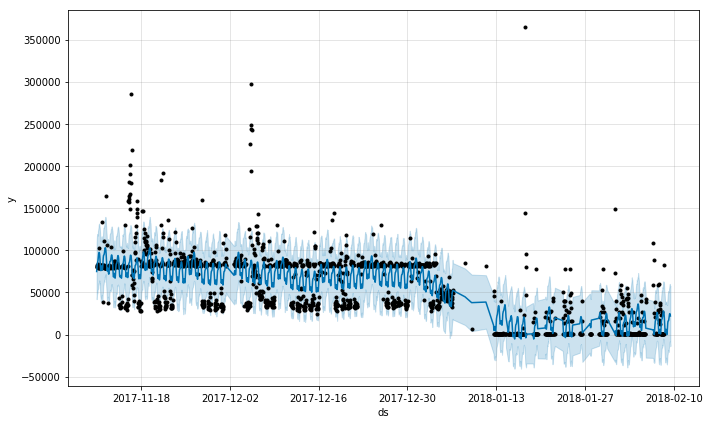

In [1223]:
ew_model.plot(ew_forcast)

In [1224]:
tt = prophet_analysis_df[ (prophet_analysis_df.target=='134.141.36.60/')]
tt

,length,test_ape_98,test_mape,test_mape_98,test_rmse,target,source
skype,1874,51.256497,28.302447,27.203613,18713.066717,134.141.36.60/,10.6.1.101
skype,1726,3575.192381,1007.143688,883.726862,32996.099143,134.141.36.60/,134.141.5.104


In [1225]:
    tt = prophet_df[(prophet_df.source=='134.141.5.104') & (prophet_df.target=='134.141.36.60/')]

    tools = 'pan,wheel_zoom,xbox_select,reset'
    
    
    output_notebook()
    p=figure(title='smoothed',plot_height = 600 ,plot_width =800,tools=[tools])
    
    p.circle('ds','y',source=tt,color='green')
    p.line('ds','y',source=tt,color='orange')
    p.line('ds','yhat',source=tt,color='blue')
    p.circle('ds','yhat',source=tt,color='blue')
    show(p)

Loading BokehJS ...

####  2.

In [1289]:
tt = appid_datapoint_alld_skype[(appid_datapoint_alld_skype.source=='134.141.5.104') & (appid_datapoint_alld_skype.target_address=='134.141.124.11/')]
tools = 'pan,wheel_zoom,xbox_select,reset'
    
    
output_notebook()
p=figure(title='smoothed',plot_height = 600 ,plot_width =800,tools=[tools])
    
p.circle('time_stamp','app_rsp_time',source=tt,color='green')
p.line('time_stamp','app_rsp_time',source=tt,color='orange')

show(p)

Loading BokehJS ...

In [1290]:
aid = tt.target_attribute_id.unique()

tt_attr = appid_attribute[(appid_attribute.source=='134.141.5.104') & (appid_attribute.target_address=='134.141.124.11/')]

tt_attr[tt_attr.attribute_id.isin(aid)].target_type.value_counts()

SERVER    1835
CLIENT      27
Name: target_type, dtype: int64

In [1215]:
ew_prophet,ew_model,ew_forcast,ew_pred_df=(create_prophet_m('skype',tt))

App name: skype
MSE  : 77539819.8832302
RMSE : 8805.669757788455
MAPE : 42.61900813593322
                   ds      y          yhat    error_test   train_mean  \
0 2018-02-08 14:00:00  19766  12566.817349   7199.182651  9370.676823   
1 2018-02-08 15:00:00  19988  14156.129051   5831.870949  9370.676823   
2 2018-02-08 16:00:00  11343  13319.757518  -1976.757518  9370.676823   
3 2018-02-08 17:00:00  19996  10856.107519   9139.892481  9370.676823   
4 2018-02-08 18:00:00  20461   9013.996621  11447.003379  9370.676823   

      mean_diff   mean_APE        APE  
0  10395.323177  52.591942  36.422051  
1  10617.323177  53.118487  29.176861  
2   1972.323177  17.388021  17.427114  
3  10625.323177  53.137243  45.708604  
4  11090.323177  54.202254  55.945474  


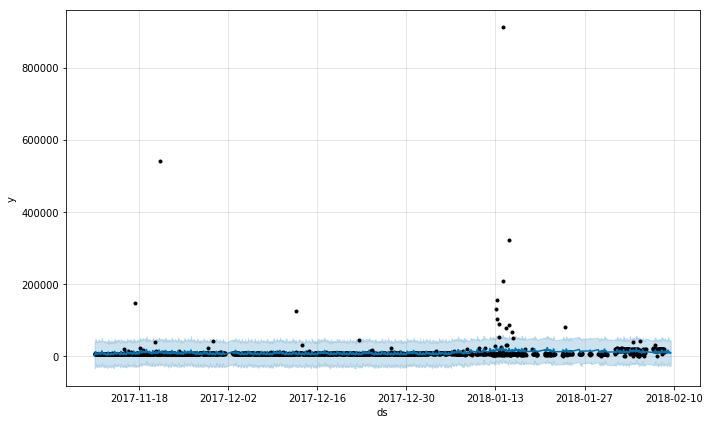

In [1216]:
ew_model.plot(ew_forcast)

In [1193]:
tt = prophet_analysis_df[ (prophet_analysis_df.target=='134.141.124.11/')]
tt

,length,test_ape_98,test_mape,test_mape_98,test_rmse,target,source
skype,1872,94.093393,19.055720,15.615799,476972.907738,134.141.124.11/,10.6.1.101
skype,1862,62.828210,42.619008,41.653421,8805.669758,134.141.124.11/,134.141.5.104


In [1211]:
    tt = prophet_df[(prophet_df.source=='134.141.5.104') & (prophet_df.target=='134.141.124.11/')]

    tools = 'pan,wheel_zoom,xbox_select,reset'
    
    
    output_notebook()
    p=figure(title='smoothed',plot_height = 600 ,plot_width =800,tools=[tools])
    
    p.circle('ds','y',source=tt,color='green')
    p.line('ds','y',source=tt,color='orange')
    p.line('ds','yhat',source=tt,color='blue')
    p.circle('ds','yhat',source=tt,color='blue')
    show(p)

Loading BokehJS ...

#### 3.

In [1287]:
tt = appid_datapoint_alld_skype[(appid_datapoint_alld_skype.source=='134.141.5.104') & (appid_datapoint_alld_skype.target_address=='10.6.16.182/')]
tools = 'pan,wheel_zoom,xbox_select,reset'
    
    
output_notebook()
p=figure(title='smoothed',plot_height = 600 ,plot_width =800,tools=[tools])
    
p.circle('time_stamp','app_rsp_time',source=tt,color='green')
p.line('time_stamp','app_rsp_time',source=tt,color='orange')

show(p)

Loading BokehJS ...

In [1288]:
aid = tt.target_attribute_id.unique()

tt_attr = appid_attribute[(appid_attribute.source=='134.141.5.104') & (appid_attribute.target_address=='10.6.16.182/')]

tt_attr[tt_attr.attribute_id.isin(aid)].target_type.value_counts()

CLIENT    1668
SERVER     262
Name: target_type, dtype: int64

In [1260]:
ew_prophet,ew_model,ew_forcast,ew_pred_df=(create_prophet_m('skype',tt))

App name: skype
MSE  : 19772747.412697434
RMSE : 4446.65575603705
MAPE : 15.400236349852776
                   ds      y          yhat    error_test    train_mean  \
0 2018-02-08 15:00:00  12372  19189.306598  -6817.306598  19740.004197   
1 2018-02-08 16:00:00  30142  19092.827695  11049.172305  19740.004197   
2 2018-02-08 17:00:00  23177  19135.762225   4041.237775  19740.004197   
3 2018-02-08 18:00:00  18994  19465.148756   -471.148756  19740.004197   
4 2018-02-08 19:00:00  25753  19875.551943   5877.448057  19740.004197   

      mean_diff   mean_APE        APE  
0   7368.004197  59.553865  55.102704  
1  10401.995803  34.509972  36.657064  
2   3436.995803  14.829339  17.436414  
3    746.004197   3.927578   2.480514  
4   6012.995803  23.348720  22.822382  


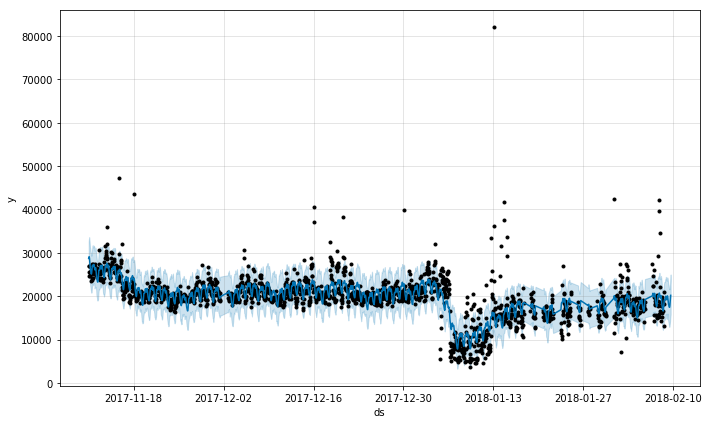

In [1261]:
ew_model.plot(ew_forcast)

10.6.16.182/	134.141.5.104

In [1262]:
tt = prophet_analysis_df[ (prophet_analysis_df.target=='10.120.89.113/')]
tt

,length,test_ape_98,test_mape,test_mape_98,test_rmse,target,source
skype,1856,10.941272,3.731738,3.309642,6285.591515,10.120.89.113/,10.6.1.101
skype,1782,27.939761,9.814057,8.804242,11706.869847,10.120.89.113/,134.141.5.104


In [1263]:
    tt = prophet_df[(prophet_df.source=='134.141.5.104') & (prophet_df.target=='10.6.16.182/')]

    tools = 'pan,wheel_zoom,xbox_select,reset'
    
    
    output_notebook()
    p=figure(title='smoothed',plot_height = 600 ,plot_width =800,tools=[tools])
    
    p.circle('ds','y',source=tt,color='green')
    p.line('ds','y',source=tt,color='orange')
    p.line('ds','yhat',source=tt,color='blue')
    p.circle('ds','yhat',source=tt,color='blue')
    show(p)

Loading BokehJS ...

#### 4.

In [1278]:
tt = appid_datapoint_alld_skype[(appid_datapoint_alld_skype.source=='134.141.5.104') & (appid_datapoint_alld_skype.target_address=='10.6.16.183/')]
tools = 'pan,wheel_zoom,xbox_select,reset'
    
    
output_notebook()
p=figure(title='smoothed',plot_height = 600 ,plot_width =800,tools=[tools])
    
p.circle('time_stamp','app_rsp_time',source=tt,color='green')
p.line('time_stamp','app_rsp_time',source=tt,color='orange')

show(p)

Loading BokehJS ...

In [1321]:
len(appid_attribute)

6953986

In [1318]:
tt = appid_datapoint_alld_skype[(appid_datapoint_alld_skype.source=='134.141.5.104') & (appid_datapoint_alld_skype.target_address=='10.120.89.113/')]

aid = tt.target_attribute_id.unique()

tt_attr = appid_attribute[(appid_attribute.source=='134.141.5.104') & (appid_attribute.target_address=='10.120.89.113/')]
tt_attr1 = tt_attr[tt_attr.attribute_id.isin(aid)]
tt_attr1['target_type'].value_counts()

Series([], Name: target_type, dtype: int64)

In [1320]:
tt_attr

,target_attribute_id,detailed_location,device_type,location,profile,source,target_address,target_type,time_stamp,user_data1,user_data2,username,attribute_id


In [1319]:
aid

array([214744826, 214753875, 214765324, ..., 236185308, 236203839,
       236224314])

In [1273]:
ew_prophet,ew_model,ew_forcast,ew_pred_df=(create_prophet_m('skype',tt))

App name: skype
MSE  : 9636650.971534492
RMSE : 3104.295567682706
MAPE : 15.605394198500775
                   ds      y          yhat   error_test    train_mean  \
0 2018-02-08 15:00:00  11275  17136.942170 -5861.942170  17997.790136   
1 2018-02-08 16:00:00  19893  16956.410130  2936.589870  17997.790136   
2 2018-02-08 17:00:00  16054  16866.102845  -812.102845  17997.790136   
3 2018-02-08 18:00:00  18010  17012.119361   997.880639  17997.790136   
4 2018-02-08 19:00:00  24836  17263.925352  7572.074648  17997.790136   

     mean_diff   mean_APE        APE  
0  6722.790136  59.625633  51.990618  
1  1895.209864   9.527019  14.761926  
2  1943.790136  12.107824   5.058570  
3    12.209864   0.067795   5.540703  
4  6838.209864  27.533459  30.488302  


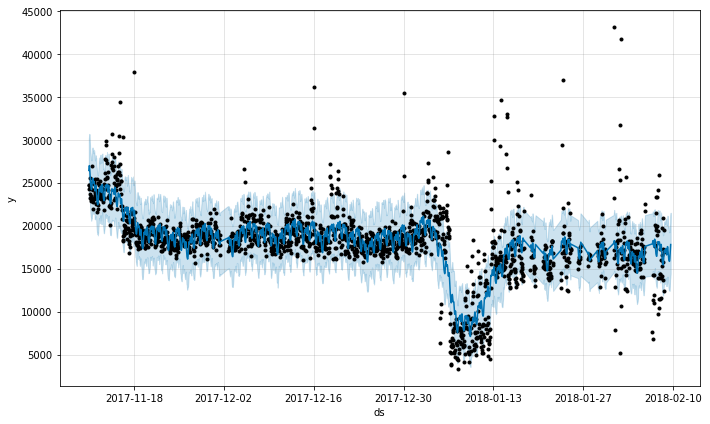

In [1274]:
ew_model.plot(ew_forcast)

In [1275]:
tt = prophet_analysis_df[ (prophet_analysis_df.target=='10.6.16.183/')]
tt

,length,test_ape_98,test_mape,test_mape_98,test_rmse,target,source
skype,1874,24.272362,11.106248,10.522577,6657.838979,10.6.16.183/,10.6.1.101
skype,1930,49.866757,15.605394,14.023428,3104.295568,10.6.16.183/,134.141.5.104


In [1276]:
    tt = prophet_df[(prophet_df.source=='134.141.5.104') & (prophet_df.target=='10.6.16.183/')]

    tools = 'pan,wheel_zoom,xbox_select,reset'
    
    
    output_notebook()
    p=figure(title='smoothed',plot_height = 600 ,plot_width =800,tools=[tools])
    
    p.circle('ds','y',source=tt,color='green')
    p.line('ds','y',source=tt,color='orange')
    p.line('ds','yhat',source=tt,color='blue')
    p.circle('ds','yhat',source=tt,color='blue')
    show(p)

Loading BokehJS ...

In [1315]:
prophet_analysis_df

,length,test_ape_98,test_mape,test_mape_98,test_rmse,target,source,SERVER_COUNT,CLIENT_COUNT
skype,1856,10.941272,3.731738,3.309642,6285.591515,10.120.89.113/,10.6.1.101,None,None
skype,1782,27.939761,9.814057,8.804242,11706.869847,10.120.89.113/,134.141.5.104,None,None
skype,1874,19.623282,10.091915,9.555282,5781.858227,10.6.16.182/,10.6.1.101,1659,212
skype,1930,46.617710,15.400236,13.674042,4446.655756,10.6.16.182/,134.141.5.104,262,1668
skype,1874,24.272362,11.106248,10.522577,6657.838979,10.6.16.183/,10.6.1.101,1685,186
skype,1930,49.866757,15.605394,14.023428,3104.295568,10.6.16.183/,134.141.5.104,674,1256
skype,1874,57.261330,16.862743,14.851825,8371.731574,10.6.16.181/,10.6.1.101,1634,237
skype,1930,132.513813,24.041333,16.561509,5788.799729,10.6.16.181/,134.141.5.104,468,1462
skype,1874,238.919254,115.490630,109.813799,268.792568,10.6.31.25/,10.6.1.101,1871,None
skype,1856,20.943160,6.638753,6.008016,9518.987740,10.120.89.114/,10.6.1.101,None,None


In [1400]:
appid_datapoint_10days.application.unique()

array(['Skype for Business', 'Microsoft Office365', 'Outlook',
       'Salesforce'], dtype=object)

## 6. For Outlook application

In [196]:
appid_datapoint_alld_outlook = appid_datapoint_10days[appid_datapoint_10days.application=='Outlook']
dates = appid_datapoint_alld_outlook.time_stamp.astype(int)
dates_outlook =pd.to_datetime(pd.Series(dates),unit='ms')
appid_datapoint_alld_outlook.index = dates_outlook
appid_datapoint_alld_outlook.shape

(428727, 16)

In [197]:
appid_datapoint_alld_outlook.target_address.value_counts()

10.6.17.64/                                                 1874
10.6.17.63/                                                 1874
10.6.98.44/WindowsCE                                        1870
10.6.98.22/WindowsCE                                        1870
10.6.99.166/WindowsCE                                       1869
10.6.99.163/WindowsCE                                       1869
10.6.99.92/WindowsCE                                        1868
10.6.99.87/WindowsCE                                        1864
10.6.99.174/                                                1850
10.6.24.122/                                                1782
134.141.123.60/gllee-PC                                     1781
10.6.99.169/                                                1752
10.6.99.145/WindowsCE                                       1741
10.6.99.97/WindowsCE                                        1625
10.6.104.52/erovner                                         1615
10.6.99.53/              

In [198]:
t_list_o = appid_datapoint_alld_outlook.target_address.unique()
s_list_o = appid_datapoint_alld_outlook.source.unique()

In [199]:
len(t_list_o)

18828

In [200]:
len(s_list_o)

6

In [201]:
prophet_df_outlook = pd.DataFrame()
prophet_analysis_df_outlook = pd.DataFrame()
temp = appid_datapoint_alld_outlook.copy()
for i in tqdm(range(0,100)):
    t = t_list_o[i]
    temp1 = temp[temp.target_address==t]
    for s in s_list_o:
        temp2 = temp1[temp1.source==s]
        if(len(temp2)<=1400):
            continue
        ew_prophet,ew_model,ew_forcast,ew_pred_df=(create_prophet_m('outlook',temp2))
        ew_pred_df['application'] = 'Outlook'
        ew_pred_df['target'] = t
        ew_pred_df['source'] = s
        #ew_pred_df['attribute_id'] = temp2.iloc[(len(temp2)-len(ew_pred_df)):len(temp2),'target_attribute_id']
        
        aid = temp2.target_attribute_id.unique()
        
        conn.close()
        conn = connect_to_mysql()
        with conn.cursor() as cursor:
            # Read a  record
            sql = " select * from appid_attribute where  target_address in ( '"+t+"' ) and source='"+s+"' "
            cursor.execute(sql) 
            tt_attr = pd.DataFrame(cursor.fetchall())
            
        
        #tt_attr = appid_attribute[(appid_attribute.source==s) & (appid_attribute.target_address==t)]

        vc = tt_attr[tt_attr.attribute_id.isin(aid)].target_type.value_counts()
        ew_prophet['target'] = t
        ew_prophet['source'] = s
        vc_i = vc.index
        ew_prophet['SERVER_COUNT'] = None
        ew_prophet['CLIENT_COUNT'] = None
        
        
        for k in vc_i:
            k1 =k+'_COUNT'
            ew_prophet[k1]=vc[k]
        
        
        prophet_df_outlook = prophet_df_outlook.append(ew_pred_df)  
        prophet_analysis_df_outlook = prophet_analysis_df_outlook.append(ew_prophet)
        
    

  7%|▋         | 7/100 [00:00<00:03, 29.60it/s]

1327545
ind
157498.0
1247351.0 120291.0


  9%|▉         | 9/100 [00:05<00:58,  1.56it/s]

App name: outlook
MSE  : 11438936.05173818
RMSE : 3382.1496199515154
MAPE : 3.8007635986492136
                   ds      y          yhat   error_test    train_mean  \
0 2018-02-08 19:00:00  79905  77275.993374  2629.006626  71821.747959   
1 2018-02-08 20:00:00  79999  77706.181210  2292.818790  71821.747959   
2 2018-02-08 21:00:00  81975  78226.728414  3748.271586  71821.747959   
3 2018-02-08 22:00:00  70322  78328.099649 -8006.099649  71821.747959   
4 2018-02-08 23:00:00  79462  77986.304453  1475.695547  71821.747959   

      mean_diff   mean_APE        APE  
0   8083.252041  10.116078   3.290165  
1   8177.252041  10.221693   2.866059  
2  10153.252041  12.385791   4.572457  
3   1499.747959   2.132687  11.384915  
4   7640.252041   9.614976   1.857108  
2144719
ind
94961.0
2094557.0 75243.0


 11%|█         | 11/100 [00:11<01:29,  1.00s/it]

App name: outlook
MSE  : 25027730.917783007
RMSE : 5002.772323200707
MAPE : 2.783698107315813
                   ds      y          yhat   error_test    train_mean  \
0 2018-02-08 19:00:00  56557  56017.618729   539.381271  52679.784775   
1 2018-02-08 20:00:00  56350  56028.828511   321.171489  52679.784775   
2 2018-02-08 21:00:00  57342  56359.112390   982.887610  52679.784775   
3 2018-02-08 22:00:00  54671  56672.837106 -2001.837106  52679.784775   
4 2018-02-08 23:00:00  54132  56640.218324 -2508.218324  52679.784775   

     mean_diff  mean_APE       APE  
0  3877.215225  6.855412  0.953695  
1  3670.215225  6.513248  0.569958  
2  4662.215225  8.130542  1.714080  
3  1991.215225  3.642178  3.661607  
4  1452.215225  2.682730  4.633522  
732953
ind
99914.0
676896.5 84084.75


 12%|█▏        | 12/100 [00:16<02:04,  1.42s/it]

App name: outlook
MSE  : 8733017.248253139
RMSE : 2955.1678883361496
MAPE : 5.0908032572712445
                   ds      y          yhat   error_test    train_mean  \
0 2018-02-08 19:00:00  55850  58375.937810 -2525.937810  51892.546841   
1 2018-02-08 20:00:00  57022  58593.588253 -1571.588253  51892.546841   
2 2018-02-08 21:00:00  57599  58723.090878 -1124.090878  51892.546841   
3 2018-02-08 22:00:00  56693  58712.727496 -2019.727496  51892.546841   
4 2018-02-08 23:00:00  56198  58674.099027 -2476.099027  51892.546841   

     mean_diff  mean_APE       APE  
0  3957.453159  7.085861  4.522718  
1  5129.453159  8.995569  2.756109  
2  5706.453159  9.907209  1.951581  
3  4800.453159  8.467453  3.562569  
4  4305.453159  7.661221  4.406027  
3047524
ind
57112.0
3018374.0 43725.0


 13%|█▎        | 13/100 [00:21<02:21,  1.63s/it]

App name: outlook
MSE  : 609004.6169885845
RMSE : 780.387478749233
MAPE : 1.8937241810860443
                   ds      y          yhat   error_test    train_mean  \
0 2018-02-08 19:00:00  27765  27683.995864    81.004136  29233.334719   
1 2018-02-08 20:00:00  27687  27692.464811    -5.464811  29233.334719   
2 2018-02-08 21:00:00  27963  27718.330115   244.669885  29233.334719   
3 2018-02-08 22:00:00  29202  27679.563314  1522.436686  29233.334719   
4 2018-02-08 23:00:00  27901  27561.326296   339.673704  29233.334719   

     mean_diff  mean_APE       APE  
0  1468.334719  5.288438  0.291749  
1  1546.334719  5.585057  0.019738  
2  1270.334719  4.542913  0.874977  
3    31.334719  0.107303  5.213467  
4  1332.334719  4.775222  1.217425  
1844732
ind
95926.0
1793638.0 76641.0


 19%|█▉        | 19/100 [00:27<01:58,  1.46s/it]

App name: outlook
MSE  : 1044819.847558828
RMSE : 1022.1642957757955
MAPE : 1.8084632118878086
                   ds      y          yhat  error_test    train_mean  \
0 2018-01-22 19:00:00  49111  49019.605581   91.394419  50393.785894   
1 2018-01-22 20:00:00  49355  49208.012388  146.987612  50393.785894   
2 2018-01-22 21:00:00  48941  49632.630528 -691.630528  50393.785894   
3 2018-01-22 22:00:00  50409  49887.461472  521.538528  50393.785894   
4 2018-01-22 23:00:00  48993  49705.362580 -712.362580  50393.785894   

     mean_diff  mean_APE       APE  
0  1282.785894  2.612013  0.186098  
1  1038.785894  2.104723  0.297817  
2  1452.785894  2.968443  1.413192  
3    15.214106  0.030181  1.034614  
4  1400.785894  2.859155  1.454009  
4315902
ind
57263.0
4286744.0 43737.0


 21%|██        | 21/100 [00:32<02:01,  1.54s/it]

App name: outlook
MSE  : 281184480.58195585
RMSE : 16768.556305834914
MAPE : 4.907591679381862
                   ds       y          yhat    error_test    train_mean  \
0 2018-02-08 19:00:00   28930  28476.607905    453.392095  29421.831198   
1 2018-02-08 20:00:00  110491  28501.142536  81989.857464  29421.831198   
2 2018-02-08 21:00:00   27760  28451.736583   -691.736583  29421.831198   
3 2018-02-08 22:00:00   28648  28300.719985    347.280015  29421.831198   
4 2018-02-08 23:00:00   27885  28081.631808   -196.631808  29421.831198   

      mean_diff   mean_APE        APE  
0    491.831198   1.700073   1.567204  
1  81069.168802  73.371740  74.205010  
2   1661.831198   5.986424   2.491846  
3    773.831198   2.701170   1.212231  
4   1536.831198   5.511319   0.705153  
1915812
ind
57172.0
1886599.0 43819.5


 23%|██▎       | 23/100 [00:37<02:05,  1.63s/it]

App name: outlook
MSE  : 713066.4638975436
RMSE : 844.4326283946775
MAPE : 2.1315735751461573
                   ds      y          yhat   error_test    train_mean  \
0 2018-02-08 19:00:00  30977  28173.264186  2803.735814  29698.940339   
1 2018-02-08 20:00:00  28538  28742.087439  -204.087439  29698.940339   
2 2018-02-08 21:00:00  28317  28721.248799  -404.248799  29698.940339   
3 2018-02-08 22:00:00  29441  28137.123584  1303.876416  29698.940339   
4 2018-02-08 23:00:00  27754  27594.808856   159.191144  29698.940339   

     mean_diff  mean_APE       APE  
0  1278.059661  4.125834  9.051024  
1  1160.940339  4.068051  0.715143  
2  1381.940339  4.880250  1.427583  
3   257.940339  0.876126  4.428778  
4  1944.940339  7.007784  0.573579  
6887055
ind
58840.0
6848367.0 58032.0


 24%|██▍       | 24/100 [00:42<02:15,  1.79s/it]

App name: outlook
MSE  : 1410626.3603824098
RMSE : 1187.6979247192485
MAPE : 1.7604752863010624
                   ds      y          yhat   error_test    train_mean  \
0 2018-02-08 19:00:00  51071  47508.906207  3562.093793  40655.392739   
1 2018-02-08 20:00:00  50152  47427.808756  2724.191244  40655.392739   
2 2018-02-08 21:00:00  47097  47495.352396  -398.352396  40655.392739   
3 2018-02-08 22:00:00  46918  47637.247381  -719.247381  40655.392739   
4 2018-02-08 23:00:00  47965  47689.009920   275.990080  40655.392739   

      mean_diff   mean_APE       APE  
0  10415.607261  20.394367  6.974788  
1   9496.607261  18.935650  5.431870  
2   6441.607261  13.677320  0.845813  
3   6262.607261  13.347984  1.532988  
4   7309.607261  15.239461  0.575399  
8778326
ind
57481.0
8749057.0 43903.5


 27%|██▋       | 27/100 [00:47<02:08,  1.77s/it]

App name: outlook
MSE  : 538599.8721990054
RMSE : 733.8936382058407
MAPE : 2.3953580182294503
                   ds      y          yhat   error_test    train_mean  \
0 2018-02-03 16:00:00  28040  29103.799939 -1063.799939  29511.620061   
1 2018-02-03 17:00:00  28728  29073.323192  -345.323192  29511.620061   
2 2018-02-03 18:00:00  28497  29068.180159  -571.180159  29511.620061   
3 2018-02-03 19:00:00  28125  29078.658136  -953.658136  29511.620061   
4 2018-02-03 20:00:00  28910  29076.656799  -166.656799  29511.620061   

     mean_diff  mean_APE       APE  
0  1471.620061  5.248288  3.793866  
1   783.620061  2.727722  1.202044  
2  1014.620061  3.560445  2.004352  
3  1386.620061  4.930205  3.390784  
4   601.620061  2.081010  0.576468  
2327510
ind
56613.0
2298319.0 43786.5


 33%|███▎      | 33/100 [00:52<01:46,  1.59s/it]

App name: outlook
MSE  : 1612628.813716614
RMSE : 1269.893229258513
MAPE : 3.1401021890178904
                   ds      y          yhat   error_test    train_mean  \
0 2018-02-08 19:00:00  26689  29137.486084 -2448.486084  29441.498623   
1 2018-02-08 20:00:00  27847  28956.703217 -1109.703217  29441.498623   
2 2018-02-08 21:00:00  28213  28789.682007  -576.682007  29441.498623   
3 2018-02-08 22:00:00  28147  28734.386482  -587.386482  29441.498623   
4 2018-02-08 23:00:00  28036  28803.854632  -767.854632  29441.498623   

     mean_diff   mean_APE       APE  
0  2752.498623  10.313233  9.174139  
1  1594.498623   5.725926  3.985001  
2  1228.498623   4.354371  2.044029  
3  1294.498623   4.599064  2.086853  
4  1405.498623   5.013192  2.738817  


100%|██████████| 100/100 [00:54<00:00,  1.83it/s]


In [202]:
prophet_analysis_df_outlook

,length,test_ape_98,test_mape,test_mape_98,test_rmse,target,source,SERVER_COUNT,CLIENT_COUNT
outlook,1869,11.146000,3.800764,3.471018,3382.149620,10.6.99.163/WindowsCE,10.6.1.101,11,1855
outlook,1870,18.305651,2.783698,1.610263,5002.772323,10.6.98.22/WindowsCE,10.6.1.101,121,1746
outlook,1870,7.267150,5.090803,4.992995,2955.167888,10.6.98.44/WindowsCE,10.6.1.101,20,1847
outlook,1481,7.174448,1.893724,1.591499,780.387479,10.6.99.25/WindowsCE,10.6.1.101,40,1438
outlook,1625,3.901934,1.808463,1.702516,1022.164296,10.6.99.97/WindowsCE,10.6.1.101,35,1590
outlook,1850,46.231212,4.907592,1.894660,16768.556306,10.6.99.174/,10.6.1.101,84,1763
outlook,1869,6.924791,2.131574,1.830728,844.432628,10.6.99.166/WindowsCE,10.6.1.101,25,1841
outlook,1864,6.265045,1.760475,1.533766,1187.697925,10.6.99.87/WindowsCE,10.6.1.101,11,1850
outlook,1741,4.106291,2.395358,2.316537,733.893638,10.6.99.145/WindowsCE,10.6.1.101,10,1731
outlook,1868,10.536220,3.140102,2.768084,1269.893229,10.6.99.92/WindowsCE,10.6.1.101,24,1841


In [203]:
    tt = prophet_df_outlook[(prophet_df_outlook.source=='10.6.1.101') & (prophet_df_outlook.target=='10.6.98.44/WindowsCE')]

    tools = 'pan,wheel_zoom,xbox_select,reset'
    
    
    output_notebook()
    p=figure(title='smoothed',plot_height = 600 ,plot_width =800,tools=[tools])
    
    p.circle('ds','y',source=tt,color='green')
    p.line('ds','y',source=tt,color='orange')
    p.line('ds','yhat',source=tt,color='blue')
    p.circle('ds','yhat',source=tt,color='blue')
    show(p)

Loading BokehJS ...

In [204]:
    tt = prophet_df_outlook[(prophet_df_outlook.source=='10.6.1.101') & (prophet_df_outlook.target=='10.6.99.87/WindowsCE')]

    tools = 'pan,wheel_zoom,xbox_select,reset'
    
    
    output_notebook()
    p=figure(title='outlook',plot_height = 600 ,plot_width =800,tools=[tools])
    
    p.circle('ds','y',source=tt,color='green')
    p.line('ds','y',source=tt,color='orange')
    p.line('ds','yhat',source=tt,color='blue')
    p.circle('ds','yhat',source=tt,color='blue')
    show(p)

Loading BokehJS ...

## 7. for Salesforce application

In [205]:
appid_datapoint_alld_salesforce = appid_datapoint_10days[appid_datapoint_10days.application=='Salesforce']
dates = appid_datapoint_alld_salesforce.time_stamp.astype(int)
dates_outlook =pd.to_datetime(pd.Series(dates),unit='ms')
appid_datapoint_alld_salesforce.index = dates_outlook
appid_datapoint_alld_salesforce.shape

(51498, 16)

In [206]:
appid_datapoint_alld_salesforce.target_address.value_counts()

10.6.25.230/                                                1862
10.6.24.221/                                                1663
134.141.79.134/USNH-WEBDEV-D2                                757
10.6.24.56/                                                  619
134.141.77.53/                                               492
134.141.97.133/kcapulli-ws                                   485
10.6.25.222/                                                 464
134.141.97.133/kruggiero-pc                                  397
134.141.210.21/tdarundpc1-pc                                 395
134.141.168.111/                                             376
10.6.113.69/spitts-pc                                        305
134.141.97.125/mbarnett-pc                                   302
10.6.115.30/bparker-pc                                       274
134.141.79.76/                                               252
10.6.114.55/abotros-pc                                       238
10.6.114.60/bstokes-pc1  

In [207]:
t_list_o = appid_datapoint_alld_salesforce.target_address.unique()
s_list_o = appid_datapoint_alld_salesforce.source.unique()

In [208]:
prophet_df_salesforce = pd.DataFrame()
prophet_analysis_df_salesforce = pd.DataFrame()
temp = appid_datapoint_alld_salesforce.copy()
for i in tqdm(range(0,100)):
    t = t_list_o[i]
    temp1 = temp[temp.target_address==t]
    for s in s_list_o:
        temp2 = temp1[temp1.source==s]
        if(len(temp2)<=1400):
            continue
        ew_prophet,ew_model,ew_forcast,ew_pred_df=(create_prophet_m('salesforce',temp2))
        ew_pred_df['application'] = 'Salesforce'
        ew_pred_df['target'] = t
        ew_pred_df['source'] = s
        #ew_pred_df['attribute_id'] = temp2.iloc[(len(temp2)-len(ew_pred_df)):len(temp2),'target_attribute_id']
        
        aid = temp2.target_attribute_id.unique()
        
        conn.close()
        conn = connect_to_mysql()
        with conn.cursor() as cursor:
            # Read a  record
            sql = " select * from appid_attribute where  target_address in ( '"+t+"' ) and source='"+s+"' "
            cursor.execute(sql) 
            tt_attr = pd.DataFrame(cursor.fetchall())
            
        
        #tt_attr = appid_attribute[(appid_attribute.source==s) & (appid_attribute.target_address==t)]

        vc = tt_attr[tt_attr.attribute_id.isin(aid)].target_type.value_counts()
        ew_prophet['target'] = t
        ew_prophet['source'] = s
        vc_i = vc.index
        ew_prophet['SERVER_COUNT'] = None
        ew_prophet['CLIENT_COUNT'] = None
        
        
        for k in vc_i:
            k1 =k+'_COUNT'
            ew_prophet[k1]=vc[k]
        
        
        prophet_df_salesforce = prophet_df_salesforce.append(ew_pred_df)  
        prophet_analysis_df_salesforce = prophet_analysis_df_salesforce.append(ew_prophet)
        
    

  0%|          | 0/100 [00:00<?, ?it/s]

170747
ind
62490.0
138340.0 48610.5


  1%|          | 1/100 [00:04<07:22,  4.47s/it]

App name: salesforce
MSE  : 8382782.915136866
RMSE : 2895.303596367204
MAPE : 8.62019015105128
                   ds      y          yhat   error_test    train_mean  \
0 2018-01-31 20:00:00  40804  34030.362609  6773.637391  32939.943558   
1 2018-01-31 21:00:00  31797  34063.159522 -2266.159522  32939.943558   
2 2018-01-31 22:00:00  30390  33746.140745 -3356.140745  32939.943558   
3 2018-01-31 23:00:00  30661  33273.647425 -2612.647425  32939.943558   
4 2018-02-01 00:00:00  30806  33019.128300 -2213.128300  32939.943558   

     mean_diff   mean_APE        APE  
0  7864.056442  19.272759  16.600425  
1  1142.943558   3.594501   7.126960  
2  2549.943558   8.390732  11.043569  
3  2278.943558   7.432711   8.521077  
4  2133.943558   6.927039   7.184082  
273573
ind
99492.0
211969.5 92405.25


 28%|██▊       | 28/100 [00:09<00:24,  2.94it/s]

App name: salesforce
MSE  : 15861460.835697956
RMSE : 3982.6449547628467
MAPE : 5.13773503091891
                   ds      y          yhat    error_test    train_mean  \
0 2018-02-08 19:00:00  71816  63460.549368   8355.450632  62248.367158   
1 2018-02-08 20:00:00  59520  63640.286289  -4120.286289  62248.367158   
2 2018-02-08 21:00:00  74512  63424.240221  11087.759779  62248.367158   
3 2018-02-08 22:00:00  57552  62766.168213  -5214.168213  62248.367158   
4 2018-02-08 23:00:00  59106  61931.685673  -2825.685673  62248.367158   

      mean_diff   mean_APE        APE  
0   9567.632842  13.322425  11.634525  
1   2728.367158   4.583950   6.922524  
2  12263.632842  16.458601  14.880502  
3   4696.367158   8.160215   9.059925  
4   3142.367158   5.316494   4.780709  


100%|██████████| 100/100 [00:10<00:00,  9.93it/s]


In [209]:
prophet_analysis_df_salesforce

,length,test_ape_98,test_mape,test_mape_98,test_rmse,target,source,SERVER_COUNT,CLIENT_COUNT
salesforce,1663,14.155409,8.620190,8.257452,2895.303596,10.6.24.221/,10.6.1.101,42,1621
salesforce,1862,13.387353,5.137735,4.714136,3982.644955,10.6.25.230/,10.6.1.101,17,1842


In [210]:
    tt = prophet_df_salesforce[(prophet_df_salesforce.source=='10.6.1.101') & (prophet_df_salesforce.target=='10.6.25.230/')]

    tools = 'pan,wheel_zoom,xbox_select,reset'
    
    
    output_notebook()
    p=figure(title='smoothed',plot_height = 600 ,plot_width =800,tools=[tools])
    
    p.circle('ds','y',source=tt,color='green')
    p.line('ds','y',source=tt,color='orange')
    p.line('ds','yhat',source=tt,color='blue')
    p.circle('ds','yhat',source=tt,color='blue')
    show(p)

Loading BokehJS ...

In [211]:
    tt = prophet_df_salesforce[(prophet_df_salesforce.source=='10.6.1.101') & (prophet_df_salesforce.target=='10.6.24.221/')]

    tools = 'pan,wheel_zoom,xbox_select,reset'
    
    
    output_notebook()
    p=figure(title='smoothed',plot_height = 600 ,plot_width =800,tools=[tools])
    
    p.circle('ds','y',source=tt,color='green')
    p.line('ds','y',source=tt,color='orange')
    p.line('ds','yhat',source=tt,color='blue')
    p.circle('ds','yhat',source=tt,color='blue')
    show(p)

Loading BokehJS ...

In [217]:
prophet_analysis_df_full = prophet_analysis_df.append(prophet_analysis_df_outlook)
prophet_analysis_df_full = prophet_analysis_df_full.append(prophet_analysis_df_salesforce)
del prophet_analysis_df_full['test_ape_98']
prophet_analysis_df_full

,length,test_mape,test_mape_98,test_rmse,target,source,SERVER_COUNT,CLIENT_COUNT
skype,1856,3.489334,3.050756,6014.380321,10.120.89.113/,10.6.1.101,549,1304
skype,1782,9.814057,8.804242,11706.869847,10.120.89.113/,134.141.5.104,1159,623
skype,1874,10.091915,9.555282,5781.858227,10.6.16.182/,10.6.1.101,1659,212
skype,1930,15.483852,13.673086,4386.172799,10.6.16.182/,134.141.5.104,262,1668
skype,1874,11.106248,10.522577,6657.838979,10.6.16.183/,10.6.1.101,1685,186
skype,1930,15.605394,14.023428,3104.295568,10.6.16.183/,134.141.5.104,674,1256
skype,1874,16.862743,14.851825,8371.731574,10.6.16.181/,10.6.1.101,1634,237
skype,1930,24.524623,16.826404,5772.848778,10.6.16.181/,134.141.5.104,468,1462
skype,1874,16.087632,15.331466,46.883000,10.6.31.25/,10.6.1.101,1871,None
skype,1856,6.385420,5.679551,9217.614123,10.120.89.114/,10.6.1.101,365,1488


In [218]:
prophet_analysis_df_full.to_csv('prophet_analysis_data_3apps.csv',index=False)

In [219]:
prophet_analysis_df_full.shape

(64, 8)

In [4]:
apps  = pd.read_csv('p1/full_apps.csv')
apps

,application,count
0,sumancreations,1
1,babson,1
2,babelway,1
3,ttweb,1
4,www.bwc.ohio.gov,1
5,b2wsoftware,1
6,b419e6f6dff7de4c1f08ce8ffea9e5e4.clo.footprint...,1
7,68.233.236.92,1
8,b5661d0343430fb0e3289ced6bfe5c77.nrb.footprint...,1
9,www.buttonwood.com.au,1


In [9]:
len(apps.loc[(apps['count']>1400),:])

912